# Big Data Project
- **Accident Data United Kingdom**

- **Context:**

This project is based on real world data: specifically, **road traffic accidents in 2020**. 

## Project Background Information.
All road traffic accidents involving casualties are logged and reported in Great Britain, along
with (probably) a majority of other non-fatal road traffic accidents. Every year, the government
releases a large batch of data associated with these reports. In this assignment we will be using the data
from **2020**.

## Accident Data Analysis
- In this analysis, I willl extract relevant informtion that will inform my report writing based on the insights gleaned.
- Import the necessary libraries
- Load the database file
- Preprocess the data
- Perform Analysis
- Visualize results

### Import required libraries
- Install packages such as mlxtend, imblearn
  - other packages and libraries will be installed and imported as the need arise

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
# required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sqlite3
%matplotlib inline
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import geopandas as gpd
import matplotlib.gridspec as gridspec
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from imblearn.over_sampling import SMOTE
from ydata_profiling import ProfileReport
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import cross_val_score
import networkx as nx
import matplotlib
import networkx as net
import urllib
import csv

C:\Program Files\Python312\Lib\site-packages\visions\utils\monkeypatches\imghdr_patch.py:2: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  from imghdr import tests


## Load the accident database file
- Connect to sqlite3 server to run SQL commands
- Instantiate a cursor connection

In [5]:
# connect to the database file by establishing a connection to SQLite database
conn = sqlite3.connect('accident_data_v1.0.0_2023.db')

In [6]:
# instantiate cursor using .connect function
# cursor allows execution of sql queries
cur = conn.cursor()

In [7]:
# examine all tables in the database 
res = cur.execute("SELECT name FROM sqlite_master")
res.fetchall()

[('accident',),
 ('sqlite_autoindex_accident_1',),
 ('casualty',),
 ('sqlite_autoindex_casualty_1',),
 ('vehicle',),
 ('sqlite_autoindex_vehicle_1',),
 ('lsoa',),
 ('sqlite_autoindex_lsoa_1',)]

#### Find the length of each of the tables in the SQL Database

In [8]:
# Fetch all table names
res = cur.execute("SELECT name FROM sqlite_master WHERE type='table'")
tables = res.fetchall()

# Loop through each table and get row count
for table in tables:
    table_name = table[0]
    count_res = cur.execute(f"SELECT COUNT(*) FROM {table_name}")
    row_count = count_res.fetchone()[0]
    print(f"Table {table_name} has {row_count} rows.")


Table accident has 461352 rows.
Table casualty has 600332 rows.
Table vehicle has 849091 rows.
Table lsoa has 34378 rows.


## Examine Foreign and Primary Keys from each Database table

In [9]:
# define a fucntionthat returns the primary keys in each database table
def extract_primary_keys(table_name):
    '''This queries the sqlite_master table to find the table information and then parses the column information since primary keys
     are specificied using the PRIMARY KEY constraint in the CREATE TABLE statement
    '''
    cur.execute(f"PRAGMA table_info({table_name})")
    columns  = cur.fetchall()
    pri_keys = [column[1] for column in columns if column[5] == 1]
    return pri_keys

# define a function to return foreign keys in each database table
def extract_foreign_keys(table_name):
    '''This function parses the SQL CREATE TABLE statements of each table and identifies the columns with the refrences keyword.
    The reference keyword indicates that a column is a foreign key referncing another table's primary key.
    '''
    cur.execute(f"SELECT sql from sqlite_master WHERE type='table' AND name='{table_name}'")
    create_table_statement = cur.fetchone()[0]
    foreign_keys = [fk.split('REFERENCES')[0].strip() for fk in create_table_statement.split(',') if 'REFERENCES' in fk]
    return foreign_keys


"""
This piece of code has been extracted from stackoverflow [https://stackoverflow.com/questions/70059254/how-to-get-a-list-of-tables-that-have-one-on-one-relationship-to-a-given-table-i]
"""

'\nThis piece of code has been extracted from stackoverflow [https://stackoverflow.com/questions/70059254/how-to-get-a-list-of-tables-that-have-one-on-one-relationship-to-a-given-table-i]\n'

In [10]:
# Call earlier defined functions to extract primary keys
table_name = 'accident'
pri_keys = extract_primary_keys(table_name)
print(f"The primary key for the accident table is {table_name}: {pri_keys}")


table_name = 'casualty'
pri_keys = extract_primary_keys(table_name)
print(f"The primary key for the casualty table is {table_name}: {pri_keys}")

table_name = 'vehicle'
pri_keys = extract_primary_keys(table_name)
print(f"The primary key for the vehicle table is {table_name}: {pri_keys}")

table_name = 'lsoa'
pri_keys = extract_primary_keys(table_name)
print(f"The primary key for the lsoa table is {table_name}: {pri_keys}")

The primary key for the accident table is accident: ['accident_index']
The primary key for the casualty table is casualty: ['casualty_index']
The primary key for the vehicle table is vehicle: ['vehicle_index']
The primary key for the lsoa table is lsoa: ['objectid']


In [11]:
# Allow foreign key support in SQLite as foreign key constraints aren't enabled by default.
cur.execute("PRAGMA foreign_keys = ON")

# Call earlier defined function to extract primary keys
table_name = 'accident'
for_keys = extract_foreign_keys(table_name)
print(f"The foreign key for the accident table is {table_name}: {for_keys}")


table_name = 'casualty'
for_keys = extract_foreign_keys(table_name)
print(f"The foreign key for the accident table is {table_name}: {for_keys}")

table_name = 'vehicle'
for_keys = extract_foreign_keys(table_name)
print(f"The foreign key for the accident table is {table_name}: {for_keys}")
for_keys
table_name = 'lsoa'
for_keys = extract_foreign_keys(table_name)
print(f"The foreign key for the accident table is {table_name}: {for_keys}")


The foreign key for the accident table is accident: []
The foreign key for the accident table is casualty: ['FOREIGN KEY(accident_index)']
The foreign key for the accident table is vehicle: ['FOREIGN KEY(accident_index)']
The foreign key for the accident table is lsoa: []


### Extract attributes from each of the tables. 
- Extraction of attributes from each table is necessary to idenfity foreign and primary keys that can be used to model the relationship between the tables.
- This is particularly useful when extracting information from multiple tables.

#### Accident Table

In [12]:
# find all attributes in accident table
accident_info = cur.execute(f"PRAGMA table_info(accident)")
accident_info.fetchall()

[(0, 'accident_index', '', 0, None, 1),
 (1, 'accident_year', '', 0, None, 0),
 (2, 'accident_reference', '', 0, None, 0),
 (3, 'location_easting_osgr', '', 0, None, 0),
 (4, 'location_northing_osgr', '', 0, None, 0),
 (5, 'longitude', '', 0, None, 0),
 (6, 'latitude', '', 0, None, 0),
 (7, 'police_force', '', 0, None, 0),
 (8, 'accident_severity', '', 0, None, 0),
 (9, 'number_of_vehicles', '', 0, None, 0),
 (10, 'number_of_casualties', '', 0, None, 0),
 (11, 'date', '', 0, None, 0),
 (12, 'day_of_week', '', 0, None, 0),
 (13, 'time', '', 0, None, 0),
 (14, 'local_authority_district', '', 0, None, 0),
 (15, 'local_authority_ons_district', '', 0, None, 0),
 (16, 'local_authority_highway', '', 0, None, 0),
 (17, 'first_road_class', '', 0, None, 0),
 (18, 'first_road_number', '', 0, None, 0),
 (19, 'road_type', '', 0, None, 0),
 (20, 'speed_limit', '', 0, None, 0),
 (21, 'junction_detail', '', 0, None, 0),
 (22, 'junction_control', '', 0, None, 0),
 (23, 'second_road_class', '', 0, None,

In [13]:
# Fetch all rows from the query result
column_accident = accident_info.fetchall()

# Use a list comprehension to extract the column names
accident_names = [column[1] for column in cur.execute(f"PRAGMA table_info(accident)")]

# Print the list of column names
print(accident_names)

['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']


#### Casualty Table

In [14]:
# find all columns or attributes in casualty table
casualty_info = cur.execute(f"PRAGMA table_info(casualty)")
casualty_info.fetchall()

[(0, 'casualty_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'casualty_reference', '', 0, None, 0),
 (6, 'casualty_class', '', 0, None, 0),
 (7, 'sex_of_casualty', '', 0, None, 0),
 (8, 'age_of_casualty', '', 0, None, 0),
 (9, 'age_band_of_casualty', '', 0, None, 0),
 (10, 'casualty_severity', '', 0, None, 0),
 (11, 'pedestrian_location', '', 0, None, 0),
 (12, 'pedestrian_movement', '', 0, None, 0),
 (13, 'car_passenger', '', 0, None, 0),
 (14, 'bus_or_coach_passenger', '', 0, None, 0),
 (15, 'pedestrian_road_maintenance_worker', '', 0, None, 0),
 (16, 'casualty_type', '', 0, None, 0),
 (17, 'casualty_home_area_type', '', 0, None, 0),
 (18, 'casualty_imd_decile', '', 0, None, 0)]

In [15]:
# Fetch all rows from the query result
column_casualty = accident_info.fetchall()

# Use a list comprehension to extract the column names
casualty_names = [column[1] for column in cur.execute(f"PRAGMA table_info(casualty)")]

# Print the list of column names
print(casualty_names)

['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'casualty_severity', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type', 'casualty_imd_decile']


#### Vehicle Table

In [16]:
# find all attributes in vehicle table
vehicle_info = cur.execute(f"PRAGMA table_info(vehicle)")
vehicle_info.fetchall()

[(0, 'vehicle_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'vehicle_type', '', 0, None, 0),
 (6, 'towing_and_articulation', '', 0, None, 0),
 (7, 'vehicle_manoeuvre', '', 0, None, 0),
 (8, 'vehicle_direction_from', '', 0, None, 0),
 (9, 'vehicle_direction_to', '', 0, None, 0),
 (10, 'vehicle_location_restricted_lane', '', 0, None, 0),
 (11, 'junction_location', '', 0, None, 0),
 (12, 'skidding_and_overturning', '', 0, None, 0),
 (13, 'hit_object_in_carriageway', '', 0, None, 0),
 (14, 'vehicle_leaving_carriageway', '', 0, None, 0),
 (15, 'hit_object_off_carriageway', '', 0, None, 0),
 (16, 'first_point_of_impact', '', 0, None, 0),
 (17, 'vehicle_left_hand_drive', '', 0, None, 0),
 (18, 'journey_purpose_of_driver', '', 0, None, 0),
 (19, 'sex_of_driver', '', 0, None, 0),
 (20, 'age_of_driver', '', 0, None, 0),
 (21, 'age_band_of_driver', 

In [17]:
# Fetch all rows from the vehilce table query result
column_vehicle = vehicle_info.fetchall()

# Use a list comprehension to extract the column names
vehicle_names = [column_vehicle[1] for column_vehicle in cur.execute(f"PRAGMA table_info(vehicle)")]

# Print the list of column names
print(vehicle_names)

['vehicle_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning', 'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway', 'first_point_of_impact', 'vehicle_left_hand_drive', 'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code', 'age_of_vehicle', 'generic_make_model', 'driver_imd_decile', 'driver_home_area_type']


#### LSOA Table

In [18]:
# find all attributes in lsoa table
lsoa_info = cur.execute(f"PRAGMA table_info(lsoa)")
lsoa_info.fetchall()

[(0, 'objectid', '', 0, None, 1),
 (1, 'lsoa01cd', '', 0, None, 0),
 (2, 'lsoa01nm', '', 0, None, 0),
 (3, 'lsoa01nmw', '', 0, None, 0),
 (4, 'shape__area', '', 0, None, 0),
 (5, 'shape__length', '', 0, None, 0),
 (6, 'globalid', '', 0, None, 0)]

In [19]:
# Fetch all rows from the lsoa table query result
column_lsoa = lsoa_info.fetchall()

# Use a list comprehension to extract the column names
lsoa_names = [column_lsoa [1] for column_lsoa  in cur.execute(f"PRAGMA table_info(lsoa)")]

# Print the list of column names
print(lsoa_names)

['objectid', 'lsoa01cd', 'lsoa01nm', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid']


### Extract Information from each table filtering by the year '2020'
- Iteratively extract information from each table using SQL Command queries

In [20]:
# define a function to pass a query and return result as a dataframe stored in the data variable name
def extract_table_data(query,connector, cursor):
     
    # query the data 
    cursor.execute(query)
    
    # Fetch the result
    data = pd.read_sql_query(query,connector)

    # return the dataframe
    return data

In [21]:
# extract information from the accident table
accident_data = extract_table_data(f"SELECT * FROM accident WHERE accident_year = 2020", conn, cur)
accident_data

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [22]:
# extract information from the casualty table
casualty_data = extract_table_data(f"SELECT * FROM casualty WHERE accident_year = 2020", conn, cur)
casualty_data

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


In [23]:
# extract information from the vehicle table
vehicle_data = extract_table_data(f"SELECT * FROM vehicle WHERE accident_year = 2020", conn, cur)
vehicle_data

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [24]:
# extract information from the lsoa table
lsoa_data = extract_table_data(f"SELECT * FROM lsoa", conn, cur) # no 'accident_year' column
lsoa_data

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


### Exploratory Data Analysis using sweetviz

In [25]:
#instal sweet viz
!pip install sweetviz

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
# import sweetviz
import sweetviz as sv

C:\Users\865515\AppData\Roaming\Python\Python312\site-packages\sweetviz\config.py:14: DeprecationWarning: open_text is deprecated. Use files() instead. Refer to https://importlib-resources.readthedocs.io/en/latest/using.html#migrating-from-legacy for migration advice.
  the_open = pkg_resources.open_text("sweetviz", 'sweetviz_defaults.ini')


In [27]:
# Load your table into a pandas DataFrame
accident_df = pd.read_sql_query("SELECT * FROM accident", conn)  # accident table
casualty_df = pd.read_sql_query("SELECT * FROM casualty", conn)  # casualty table
vehicle_df = pd.read_sql_query("SELECT * FROM vehicle", conn)   # vehicle table
lsoa_df = pd.read_sql_query("SELECT * FROM vehicle", conn) # lsoa table

In [28]:
cur.close()
conn.close()

In [ ]:
# Generate a Sweetviz report for the DataFrame
accident_report = sv.analyze(accident_df)

# Show the report in a browser
accident_report.show_html("sweetviz_report_accident.html")

In [ ]:
# Generate a Sweetviz report for the DataFrame
casualty_report = sv.analyze(casualty_df)

# Show the report in a browser
casualty_report.show_html("sweetviz_report_casualty.html")

### Exploratory Data Analysis using Pandas Profile

In [ ]:
# Generate a Sweetviz report for the DataFrame
vehicle_report = ProfileReport(vehicle_df)

# Displaythe report 
vehicle_report

In [ ]:
# Generate a Sweetviz report for the DataFrame
lsoa_report = ProfileReport(lsoa_df)

# Display the report 
lsoa_report

### Data Cleaning

According to the Exploratory Data Analysis done using SweetViz and Pandas Profiling, it has been revealed that there are missing values in four columns of the accident table. The tables are listed below

- location_easting_osgr                             
- location_northing_osgr                            
- longitude                                         
- latitude                              

They will be imputed using the mean value.

In [30]:
# Replace NaN values with the mean value of the column
accident_data['location_easting_osgr'].fillna(accident_data['location_easting_osgr'].mean(), inplace=True)
accident_data['location_northing_osgr'].fillna(accident_data['location_northing_osgr'].mean(), inplace=True)
accident_data['longitude'].fillna(accident_data['longitude'].mean(), inplace=True)
accident_data['latitude'].fillna(accident_data['latitude'].mean(), inplace=True)

Also, there are quite a number of **-1 values which according to the road safety open dataset, -1 represents missing entry**. I have decided to impute the missing entries using KNN imputer. However, the generic_make_model column in the vehicle_data dataframe also has -1 coded as a string.

In [31]:
# examine total number of negative values in 'generic_make_model' column
negative_values = (vehicle_data['generic_make_model'] == '-1').sum()
print(f"Number of '-1' values in the 'generic_make_model' column: {negative_values}")

Number of '-1' values in the 'generic_make_model' column: 47637


In [32]:
# drop make_generic_model columns since it is not required for analysis
vehicle_data.drop(columns=['generic_make_model'], inplace=True)

In the accident statistics data guide -1 represents data missing or out of range hence, they will be filled with nan valu

From the pandas profile report, it was also observed that the lsoa_of_accident_location had a number of missing values represented as -1

In [33]:
# examine total number of negative values in 'generic_make_model' column
lsoa_acc_loc = (accident_data['lsoa_of_accident_location'] =='-1').sum()
print(f"Number of '-1' values in the 'generic_make_model' column: {lsoa_acc_loc}")

Number of '-1' values in the 'generic_make_model' column: 3851


In [34]:
# replace with negative values with unknown 
accident_data['lsoa_of_accident_location'].replace('-1', 'Unknown', inplace=True)

In [35]:
# examine if it has been replaced
lsoa_acc_loc = (accident_data['lsoa_of_accident_location'] =='-1').sum()
print(f"Number of '-1' values in the 'generic_make_model' column: {lsoa_acc_loc}")

Number of '-1' values in the 'generic_make_model' column: 0


- Use KNN Imputer to impute -1 values

In [36]:
# replace all -1 values in the dataframes with NaN values
accident_data.replace(-1, np.nan, inplace=True)
casualty_data.replace(-1, np.nan, inplace=True)
vehicle_data.replace(-1, np.nan, inplace=True)

#### Initialize Imputer to fill in missing vales
- IterativeImputer is a method for imputing (filling in) missing data in a dataset. It works by modeling each feature with missing values as a function of the other features in the dataset. It then iterates, using regression to predict and impute missing values, until it converges on a solution (or the maximum number of iterations is reached)

In [37]:
# initialize Iterative imputer
imputer = IterativeImputer(max_iter=10, random_state=0)

# Defining a function to apply the imputer only on numeric columns
def impute_numeric_columns(df):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    df[numeric_cols] = imputer.fit_transform(df[numeric_cols])
    return df

# Apply the imputer to each dataset in-place
accident_data = impute_numeric_columns(accident_data)
casualty_data = impute_numeric_columns(casualty_data)
vehicle_data = impute_numeric_columns(vehicle_data)


### Map Categories using the dataset data guide

In [ ]:
# install openpyxl to access the open data guide .xlsx file
!pip install openpyxl

In [38]:
# load the file
col_code_label = pd.read_excel('road-casualty-statistics-road-safety-open-dataset-data-guide.xlsx')

In [39]:
# examine code labels
col_code_label 

,table,field name,code/format,label,note
0,Accident,collision_index,NaN,NaN,unique value for each accident. The accident_i...
1,Accident,collision_year,NaN,NaN,NaN
2,Accident,collision_reference,NaN,NaN,In year id used by the police to reference a c...
3,Accident,accident_index,NaN,NaN,unique value for each accident. The accident_i...
4,Accident,accident_year,NaN,NaN,NaN
...,...,...,...,...,...
1762,casualty_adjustment,injury_based_severity_code,5,Slight,NaN
1763,casualty_adjustment,injury_based_severity_code,6,Very Serious,NaN
1764,casualty_adjustment,injury_based_severity_code,7,Moderately Serious,NaN
1765,casualty_adjustment,injury_based_severity_code,3,Less Serious,NaN


In [40]:
# examine categories present
for column in accident_data.columns:
    if len(list(accident_data[column].unique())) < 15:
        print(column)
        print(accident_data[column].value_counts())
        print('--------------------')

accident_year
accident_year
2020.0    91199
Name: count, dtype: int64
--------------------
accident_severity
accident_severity
3.0    71453
2.0    18355
1.0     1391
Name: count, dtype: int64
--------------------
number_of_vehicles
number_of_vehicles
2.0     57392
1.0     25730
3.0      6241
4.0      1334
5.0       331
6.0        99
7.0        47
8.0        15
9.0         3
10.0        3
11.0        2
13.0        1
12.0        1
Name: count, dtype: int64
--------------------
day_of_week
day_of_week
6.0    14889
5.0    14056
4.0    13564
3.0    13267
2.0    12772
7.0    12336
1.0    10315
Name: count, dtype: int64
--------------------
first_road_class
first_road_class
3.0    40604
6.0    31709
4.0    11490
5.0     4815
1.0     2374
2.0      207
Name: count, dtype: int64
--------------------
road_type
road_type
6.0    66929
3.0    13206
1.0     5580
9.0     2006
2.0     1966
7.0     1512
Name: count, dtype: int64
--------------------
junction_detail
junction_detail
0.000000     37978
3.0

In [41]:
# examine the categories 
for column in vehicle_data.columns:
    if len(list(vehicle_data[column].unique())) < 15:
        print(column)
        print(vehicle_data[column].value_counts())
        print('--------------------')

accident_year
accident_year
2020.0    167375
Name: count, dtype: int64
--------------------
vehicle_reference
vehicle_reference
1.0      91152
2.0      65477
3.0       8106
4.0       1842
5.0        503
6.0        171
7.0         72
8.0         25
9.0         11
10.0         7
11.0         5
12.0         2
999.0        1
13.0         1
Name: count, dtype: int64
--------------------


In [42]:
# noticed a few number of negative values which are not in the Road safety open guide
# convert to positve values 
vehicle_data['towing_and_articulation'] = vehicle_data['towing_and_articulation'].abs()

In [43]:
#Checking to confirm if it has been taken care of
for column in vehicle_data.columns:
    if len(list(vehicle_data[column].unique())) < 15:
        print(column)
        print(vehicle_data[column].value_counts())
        print('--------------------')

accident_year
accident_year
2020.0    167375
Name: count, dtype: int64
--------------------
vehicle_reference
vehicle_reference
1.0      91152
2.0      65477
3.0       8106
4.0       1842
5.0        503
6.0        171
7.0         72
8.0         25
9.0         11
10.0         7
11.0         5
12.0         2
999.0        1
13.0         1
Name: count, dtype: int64
--------------------


In [44]:
# examine casualty column labels
for column in casualty_data.columns:
    if len(list(casualty_data[column].unique())) < 15:
        print(column)
        print(casualty_data[column].value_counts())
        print('--------------------')

accident_year
accident_year
2020.0    115584
Name: count, dtype: int64
--------------------
vehicle_reference
vehicle_reference
1.0      67571
2.0      44589
3.0       2846
4.0        436
5.0         99
6.0         25
7.0          6
8.0          5
9.0          2
10.0         2
11.0         2
999.0        1
Name: count, dtype: int64
--------------------
casualty_class
casualty_class
1.0    79330
2.0    21504
3.0    14750
Name: count, dtype: int64
--------------------
casualty_severity
casualty_severity
3.0    94022
2.0    20102
1.0     1460
Name: count, dtype: int64
--------------------
pedestrian_location
pedestrian_location
0.000000     100834
5.000000       5828
1.000000       2419
6.000000       1709
9.000000       1614
10.000000      1393
4.000000        845
8.000000        757
7.000000         91
2.000000         70
3.000000         22
3.253052          1
3.228201          1
Name: count, dtype: int64
--------------------
pedestrian_movement
pedestrian_movement
0.000000    100833
1

In [45]:
#Creating a copy of my existing dataframes to use for the EDA process
accident_data_label = accident_data.copy()
vehicle_data_label = vehicle_data.copy()
casualty_data_label = casualty_data.copy()

# storing the data into variables from the xlxs sheet
accident_mapping = col_code_label[col_code_label['table'] == 'Accident']
vehicle_mapping = col_code_label[col_code_label['table'] == 'Vehicle']
casualty_mapping = col_code_label[col_code_label['table'] == 'Casualty']

In [46]:
# Function to map codes to labels
def map_codes_to_labels(df, mapping_df):
    for column in df.columns:
        if column in mapping_df['field name'].values:
            # Create a dictionary for code to label mapping
            code_label_dict = dict(zip(mapping_df[mapping_df['field name'] == column]['code/format'], 
                                       mapping_df[mapping_df['field name'] == column]['label']))
            
            # Replace only the values that exist in the mapping dictionary
            df[column] = df[column].replace(code_label_dict)
    return df

# Apply the function to each dataframe
accident_data_label = map_codes_to_labels(accident_data_label, accident_mapping)
vehicle_data_label = map_codes_to_labels(vehicle_data_label, vehicle_mapping)
casualty_data_label = map_codes_to_labels(casualty_data_label, casualty_mapping)

In [51]:
#examine label mapping
accident_data_label

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020.0,010219808,521389.0,175144.0,-0.254001,51.462262,Metropolitan Police,Slight,1.0,...,unknown (self reported),Daylight,Unknown,unknown (self reported),NaN,NaN,Urban,No - accident was reported using a self comple...,Non-trunk,E01004576
1,2020010220496,2020.0,010220496,529337.0,176237.0,-0.139253,51.470327,Metropolitan Police,Slight,1.0,...,"Pelican, puffin, toucan or similar non-junctio...",Daylight,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01003034
2,2020010228005,2020.0,010228005,526432.0,182761.0,-0.178719,51.529614,Metropolitan Police,Slight,1.0,...,No physical crossing facilities within 50 metres,Darkness - lights lit,Fine no high winds,Wet or damp,NaN,NaN,Urban,Yes,Non-trunk,E01004726
3,2020010228006,2020.0,010228006,538676.0,184371.0,-0.001683,51.541210,Metropolitan Police,Serious,1.0,...,"Pelican, puffin, toucan or similar non-junctio...",Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01003617
4,2020010228011,2020.0,010228011,529324.0,181286.0,-0.137592,51.515704,Metropolitan Police,Slight,1.0,...,No physical crossing facilities within 50 metres,Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020.0,991027064,343034.0,731654.0,-2.926320,56.473539,Police Scotland,Serious,2.0,...,No physical crossing facilities within 50 metres,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,Yes,1.821826,Unknown
91195,2020991029573,2020.0,991029573,257963.0,658891.0,-4.267565,55.802353,Police Scotland,Slight,1.0,...,No physical crossing facilities within 50 metres,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,No,1.890105,Unknown
91196,2020991030297,2020.0,991030297,383664.0,810646.0,-2.271903,57.186317,Police Scotland,Serious,2.0,...,No physical crossing facilities within 50 metres,Daylight,Fine no high winds,Dry,NaN,NaN,Rural,Yes,1.676776,Unknown
91197,2020991030900,2020.0,991030900,277161.0,674852.0,-3.968753,55.950940,Police Scotland,Slight,2.0,...,No physical crossing facilities within 50 metres,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,No,1.846241,Unknown


- Data looks clean 

# Accident Data Project Questions

### Question 1: Are there significant hours of the day, and days of the week, on which accidents occur?

In [52]:
# examine time column.
accident_data_label['time']

0       2025-04-04 09:00:00
1       2025-04-04 13:55:00
2       2025-04-04 01:25:00
3       2025-04-04 01:50:00
4       2025-04-04 02:25:00
                ...        
91194   2025-04-04 14:30:00
91195   2025-04-04 15:05:00
91196   2025-04-04 12:42:00
91197   2025-04-04 14:00:00
91198   2025-04-04 13:50:00
Name: time, Length: 91199, dtype: datetime64[ns]

- According to the detailed guidance on how to complete accident reporting forms

- The hours, on a 24 hour system, are to be entered in the first two boxes.
- B. The number of minutes past any of these hours should be recorded in the two right hand boxes, to
the nearest minute.
- C. Zeros should be entered where necessary, i.e. 8 minutes past 9am. is entered as 0908.
- D. The coding 0000 is now permitted for midnight. The date should be set as the following day (eg.where an accident occurs at midnight between 8th and 9th June 2011, the date entered should be
09062011).


In [53]:
# First, let's convert 'time' to a datetime type
accident_data_label['time'] = pd.to_datetime(accident_data_label['time'], errors='coerce')

In [54]:
# check data type for time
accident_data_label['time'].dtype

dtype('<M8[ns]')

- <M8: This is the internal format for a datetime object. The < indicates little-endian byte order (which is a system-specific byte ordering format), and M8 means it is a datetime64 object with a precision of 8 bytes.

- [ns]: This part indicates that the datetime object is stored with a precision of nanoseconds. In other words, the datetime object can represent time down to the nanosecond level

C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


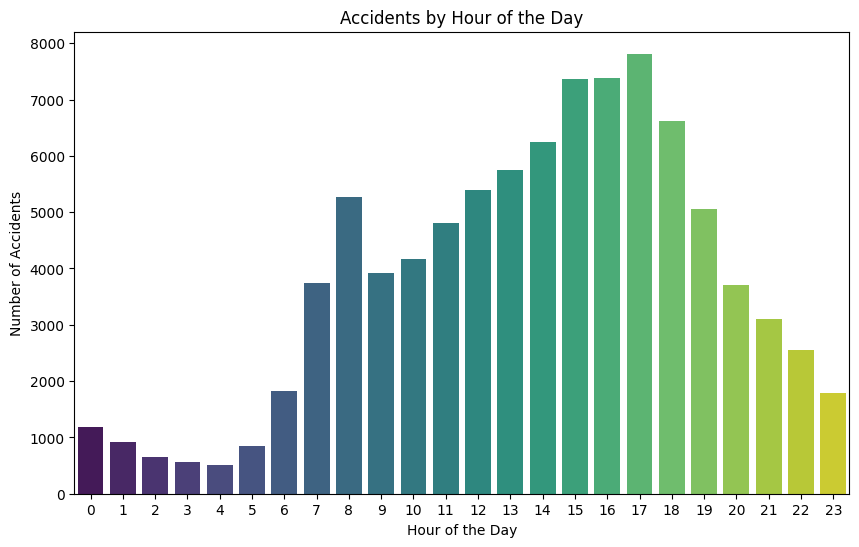

In [55]:
# Analyzing accidents by hour of the day
accident_data_label['hour_of_day'] = accident_data_label['time'].dt.hour # create new column - 'hour_of_day' and extract hour from datetime

# Plot accidents by hour of the day
plt.figure(figsize=(10,6))
sns.countplot(data=accident_data_label, x='hour_of_day', palette='viridis')
plt.title('Accidents by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.show()

In [56]:
# find unique values in 'day_of_week' column
accident_data_label['day_of_week'].unique()

array(['Tuesday', 'Monday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
       'Sunday'], dtype=object)

In [57]:
#accident_data_label['day_of_week'].value_counts()

- Employing the road casualty statistics dataset guide, label the days of the week correctly
- 1: Sunday
-  2: Monday
-  3: Tuesday
-  4: Wednesday
-  5: Thursday
-  6: Friday
-  7: Saturday

C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


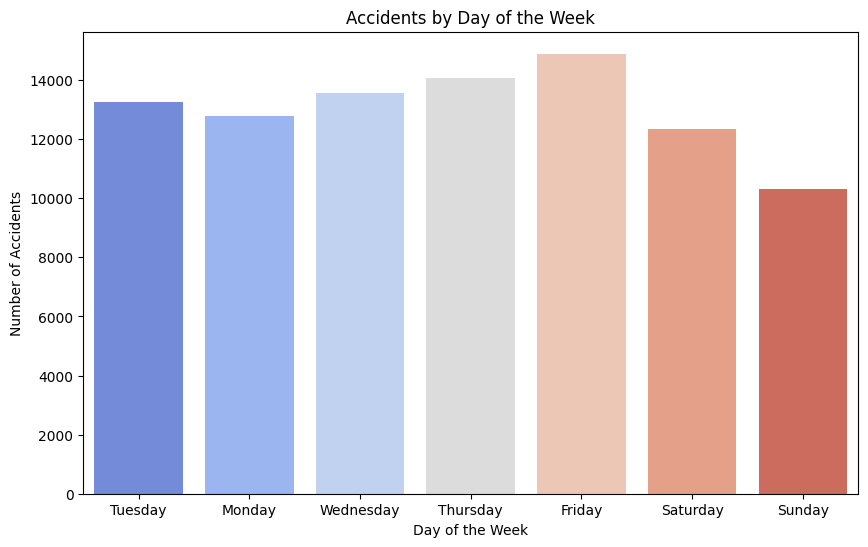

In [58]:
# Analyzing accidents by day of the week

# Plot accidents by day of the week
plt.figure(figsize=(10,6))
sns.countplot(data=accident_data_label, x='day_of_week', palette='coolwarm')
plt.title('Accidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.show()

In [59]:
#to group the number of accidents per week
accident_data_label.groupby('day_of_week')['accident_index'].count().reset_index().sort_values(by='accident_index')

,day_of_week,accident_index
3,Sunday,10315
2,Saturday,12336
1,Monday,12772
5,Tuesday,13267
6,Wednesday,13564
4,Thursday,14056
0,Friday,14889


### Question 2: For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

#### Codes for 'Vehicle_type' according to the open dataset guide form that states the meaning of the numerical values in each column.
- Motorcycle 125cc and under - 3
- Motorcycle over 125cc and up to 500cc - 4
- Motorcycle over 500cc - 5

In [60]:
# examine the unique values in 'vehicle_type' column
vehicle_data_label['vehicle_type'].unique()

array(['Car', 'Taxi/Private hire car', 'Motorcycle 125cc and under',
       'Motorcycle 50cc and under',
       'Bus or coach (17 or more pass seats)', 'Pedal cycle',
       'Other vehicle', 'Van / Goods 3.5 tonnes mgw or under',
       'Motorcycle over 125cc and up to 500cc', 'Motorcycle over 500cc',
       'Goods 7.5 tonnes mgw and over', 'Motorcycle - unknown cc',
       'Goods over 3.5t. and under 7.5t',
       'Goods vehicle - unknown weight',
       'Minibus (8 - 16 passenger seats)', 'Agricultural vehicle',
       'Electric motorcycle', 'Mobility scooter', 'Tram', 'Ridden horse'],
      dtype=object)

In [61]:
# filter the motorbikes for the unique motorbike types in 'vehicle_type' column

motorbike_cat = ['Motorcycle 125cc and under', 
                        'Motorcycle over 125cc and up to 500cc', 
                        'Motorcycle over 500cc']

In [62]:
# examine the selected motorbike categories in the vehicle_data_label column
motorbike_df = vehicle_data_label[vehicle_data_label['vehicle_type'].isin(motorbike_cat)]

In [63]:
motorbike_df

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,driver_imd_decile,driver_home_area_type
12,681728.0,2020010228020,2020.0,010228020,1.0,Motorcycle 125cc and under,No tow/articulation,Waiting to go - held up,West,East,...,No,Not known,Male,37.000000,36 - 45,114.00000,Petrol,5.000000,Less deprived 20-30%,Urban area
33,681749.0,2020010228086,2020.0,010228086,1.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,West,East,...,No,Not known,Not known,39.739946,6.865115,1079.33257,1.513318,8.026887,4.471759,1.076146
36,681752.0,2020010228097,2020.0,010228097,2.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,North,South,...,No,Not known,Male,20.000000,16 - 20,125.00000,Petrol,4.000000,Less deprived 40-50%,Urban area
58,681774.0,2020010228148,2020.0,010228148,1.0,Motorcycle 125cc and under,No tow/articulation,Overtaking static vehicle - offside,South,North,...,No,Not known,Male,20.000000,16 - 20,125.00000,Petrol,0.000000,More deprived 10-20%,Urban area
77,681793.0,2020010228207,2020.0,010228207,1.0,Motorcycle 125cc and under,No tow/articulation,unknown (self reported),unknown (self reported),unknown (self reported),...,No,Not known,Male,22.000000,21 - 25,125.00000,Petrol,9.000000,Less deprived 30-40%,Urban area
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167195,848911.0,2020991010130,2020.0,991010130,2.0,Motorcycle 125cc and under,No tow/articulation,Overtaking static vehicle - offside,West,East,...,No,Not known,Male,47.000000,46 - 55,124.00000,Petrol,17.000000,More deprived 40-50%,Urban area
167292,849008.0,2020991011809,2020.0,991011809,2.0,Motorcycle 125cc and under,No tow/articulation,Moving off,West,East,...,No,Commuting to/from work,Male,61.000000,56 - 65,124.00000,Petrol,4.000000,More deprived 20-30%,Urban area
167301,849017.0,2020991012311,2020.0,991012311,1.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,North West,South East,...,No,Journey as part of work,Male,35.000000,26 - 35,125.00000,Petrol,3.000000,More deprived 40-50%,Urban area
167304,849020.0,2020991012353,2020.0,991012353,2.0,Motorcycle over 125cc and up to 500cc,No tow/articulation,Going ahead other,South West,North East,...,No,Other,Male,48.000000,46 - 55,250.00000,Petrol,5.000000,More deprived 10-20%,Urban area


In [64]:
# Merging with accident_data_label to get accident details
motorbike_accidents = pd.merge(motorbike_df, accident_data_label, on='accident_index', how='inner')

In [65]:
# examine merged dataframe
motorbike_accidents

,vehicle_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,hour_of_day
0,681728.0,2020010228020,2020.0,010228020,1.0,Motorcycle 125cc and under,No tow/articulation,Waiting to go - held up,West,East,...,Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01001530,3
1,681749.0,2020010228086,2020.0,010228086,1.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,West,East,...,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01003186,14
2,681752.0,2020010228097,2020.0,010228097,2.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,North,South,...,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01004761,14
3,681774.0,2020010228148,2020.0,010228148,1.0,Motorcycle 125cc and under,No tow/articulation,Overtaking static vehicle - offside,South,North,...,Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,Yes,Non-trunk,E01000635,19
4,681793.0,2020010228207,2020.0,010228207,1.0,Motorcycle 125cc and under,No tow/articulation,unknown (self reported),unknown (self reported),unknown (self reported),...,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,No - accident was reported using a self comple...,Non-trunk,E01003371,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12993,848911.0,2020991010130,2020.0,991010130,2.0,Motorcycle 125cc and under,No tow/articulation,Overtaking static vehicle - offside,West,East,...,Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,No,1.803423,Unknown,16
12994,849008.0,2020991011809,2020.0,991011809,2.0,Motorcycle 125cc and under,No tow/articulation,Moving off,West,East,...,Darkness - lights lit,Other,Wet or damp,NaN,NaN,Urban,No,1.859243,Unknown,17
12995,849017.0,2020991012311,2020.0,991012311,1.0,Motorcycle 125cc and under,No tow/articulation,Going ahead other,North West,South East,...,Darkness - lights lit,Fine no high winds,Dry,NaN,NaN,Urban,Yes,1.890395,Unknown,17
12996,849020.0,2020991012353,2020.0,991012353,2.0,Motorcycle over 125cc and up to 500cc,No tow/articulation,Going ahead other,South West,North East,...,Daylight,Fine no high winds,Dry,NaN,NaN,Urban,Yes,1.804842,Unknown,15


C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


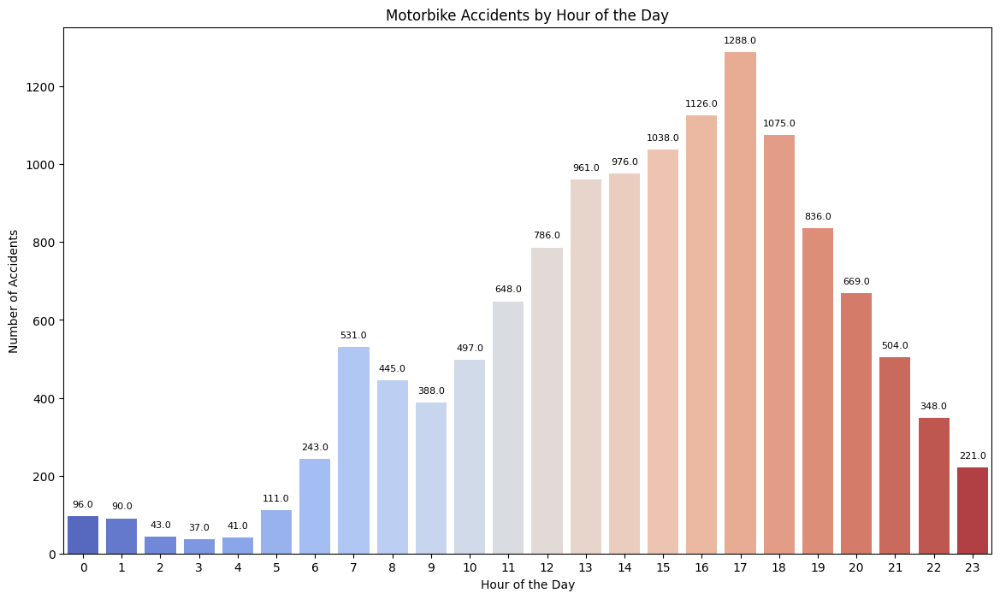

In [66]:
# Convert the 'time' column to datetime if it's not already
motorbike_accidents['time'] = pd.to_datetime(motorbike_accidents['time'], errors='coerce')

# Extract the hour from the 'time' column
motorbike_accidents['hour_of_day'] = motorbike_accidents['time'].dt.hour
# motorbike_accidents['day_of_week'] = motorbike_accidents['day_of_week'].dt.week

# Plot accidents by hour of the day for motorbikes
plt.figure(figsize=(14, 8))
ax = sns.countplot(data=motorbike_accidents, x='hour_of_day', palette='coolwarm')

# Add title and labels
plt.title('Motorbike Accidents by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')

# Add count labels on top of each bar with smaller font size
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=8, color='black',  # Adjusted fontsize here
                xytext=(0, 10), textcoords='offset points')

# Show the plot
plt.show()

C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


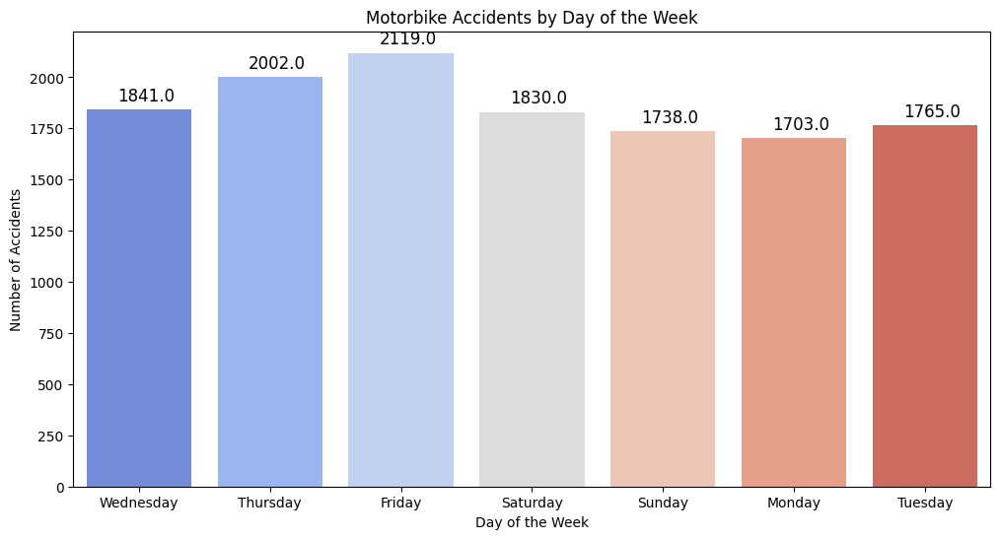

In [67]:
# Plot accidents by day of the week for motorbikes
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=motorbike_accidents, x='day_of_week', palette='coolwarm')

# Add title and labels
plt.title('Motorbike Accidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')

# Add count labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=12, color='black', 
                xytext=(5, 10), textcoords='offset points')

# Show the plot
plt.show()

### Question: 3 For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


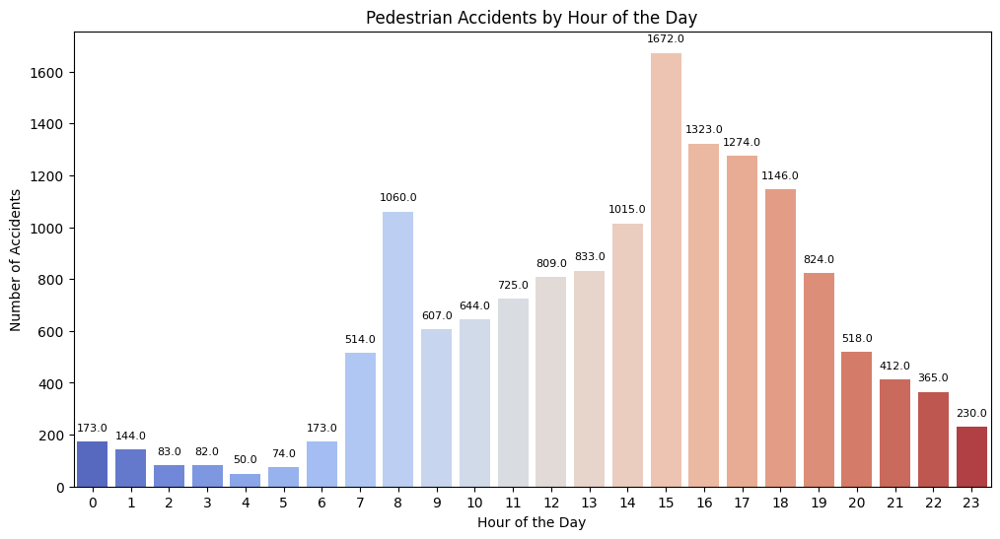

In [68]:
# Filtering the Data for Pedestrian Accidents
pedestrian_data = casualty_data_label[casualty_data_label['casualty_type'] == 'Pedestrian']

# Merging with the Accident Data using the foreign key
pedestrian_accidents = pd.merge(pedestrian_data, accident_data_label, on='accident_index', how='inner')

# Extracting the hour from the 'time' column
pedestrian_accidents['hour'] = pd.to_datetime(pedestrian_accidents['time']).dt.hour

# Plot accidents by Hour of the Day for Pedestrians
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=pedestrian_accidents, x='hour', palette='coolwarm')

# Add title and labels
plt.title('Pedestrian Accidents by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')

# Add count labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                fontsize=8, color='black',
                xytext=(0, 10), textcoords='offset points')

# Show the plot
plt.show()

C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


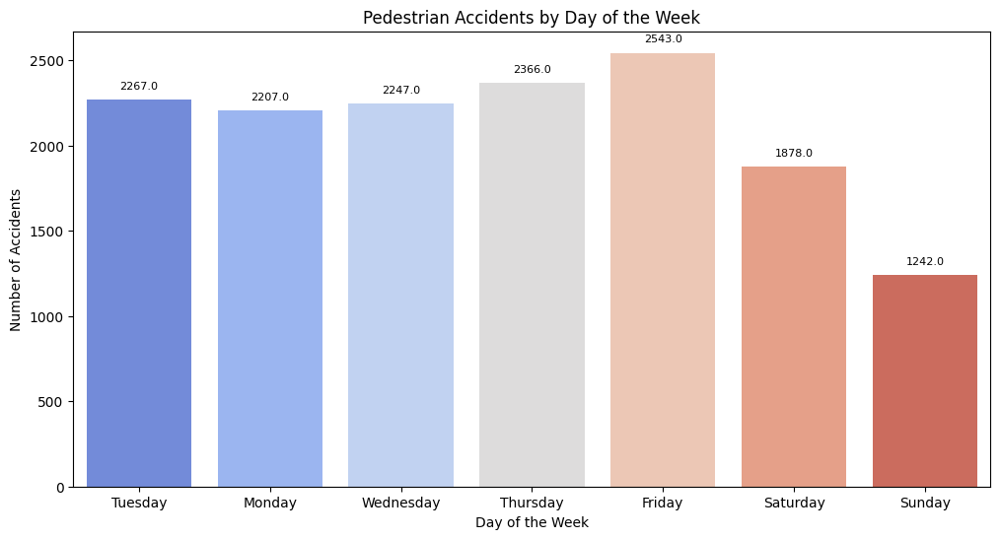

In [69]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=pedestrian_accidents, x='day_of_week', palette='coolwarm')

# Add title and labels
plt.title('Pedestrian Accidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')

# Add count labels on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                fontsize=8, color='black',  # Smaller fontsize
                xytext=(0, 10), textcoords='offset points')

# Show the plot
plt.show()

## Question 4: Using the apriori algorithm, explore the impact of selected variables on accident severity.

In [70]:
# examine aacident severity value counts
accident_data_label['accident_severity'].value_counts()

accident_severity
Slight     71453
Serious    18355
Fatal       1391
Name: count, dtype: int64

<Axes: xlabel='accident_severity'>

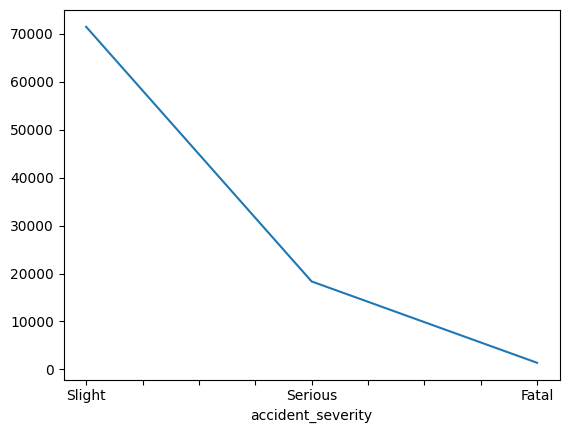

In [71]:
# examine aacident severity value counts
accident_data_label['accident_severity'].value_counts().plot()

- Fatal accidents rarely occur compared to slight or serious accidents

- **The selected variables to be examined in the 'accident data' dataframe are as follows:**
- 1. accident severity
- 2. speed limit
- 3. weather conditions
- 4. road type
- 5. light conditions
- 6. road surface conditions
- 7. junction detail
- 8. junction control
- 9. urban or rual area
- 10. number of vehicles
- 11. number of casualties
- 12. day of week
- 13. hour of day
- 14. pedestrian crossing human control
- 15. pedestrian crossing physical facilities

#### One Hot encode columns
- This is necessary since these columns are represented as categorial data

In [107]:
df = None
with sqlite3.connect('accident_data_v1.0.0_2023.db') as conn:
    cur = conn.cursor()
    query = """
    SELECT *
    FROM accident a
    JOIN vehicle v ON a.accident_index = v.accident_index
    JOIN casualty c ON a.accident_index = c.accident_index
    WHERE a.accident_year = 2020
    """
    cur.execute(query)
    res = cur.fetchall()
    # Execute query and store result in Pandas DataFrame
    df = pd.read_sql(query, conn)

df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220431,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220432,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9
220433,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9


In [108]:
def process_by_racist_indian(df, col_names):
    """
    Returns One-Hot-Encoded pandas dataframe for the columns mentioned. 
    Also, rounds all numerical values to limit number of columns
    This prevent memory overflow exceptions
    """
    try:    
        output = pd.DataFrame(None)
        df = df.applymap(lambda x: round(x, 0) if isinstance(x, (int, float)) else x)
        for col_name in col_names:
            res = pd.get_dummies(df[col_name], prefix=col_name)
            output = pd.concat([output, res], axis=1)
        output = output.astype(int)
        return output
    except Exception as e:
        print('Oh Boboye!, what have you done', e.message)

In [109]:
col_names = ['accident_severity', 'speed_limit', 'weather_conditions', 'road_type',
    'light_conditions', 'road_surface_conditions', 'junction_detail',
    'junction_control', 'urban_or_rural_area', 'number_of_vehicles',
    'number_of_casualties', 'day_of_week',
    'pedestrian_crossing_human_control', 
    'pedestrian_crossing_physical_facilities', 
    'vehicle_type', 'age_of_driver', 'age_of_vehicle', 'vehicle_manoeuvre',
    'casualty_class', 'sex_of_casualty', 'age_band_of_casualty', 
    'casualty_type', 'car_passenger', 'casualty_home_area_type', 
    'pedestrian_movement', 'pedestrian_location']

In [116]:
res_all_data = process_by_racist_indian(df,col_names)
res_all_data

,accident_severity_1,accident_severity_2,accident_severity_3,speed_limit_-1,speed_limit_20,speed_limit_30,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70,...,pedestrian_location_1,pedestrian_location_2,pedestrian_location_3,pedestrian_location_4,pedestrian_location_5,pedestrian_location_6,pedestrian_location_7,pedestrian_location_8,pedestrian_location_9,pedestrian_location_10
0,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,1,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,1,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
220431,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
220432,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
220433,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [117]:
# running Apriori and Find frequent itemsets
freq_item_sets = apriori(res_all_data, min_support=0.7, use_colnames=True)

C:\Users\865515\AppData\Roaming\Python\Python312\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [126]:
item_set_df = pd.DataFrame(freq_item_sets)
item_set_df['length'] = item_set_df['itemsets'].apply(lambda x: len(x))

print(item_set_df.head(15))

     support                                           itemsets  length
0   0.777445                              (accident_severity_3)       1
1   0.780888                             (weather_conditions_1)       1
2   0.720652                                      (road_type_6)       1
3   0.710599                               (light_conditions_1)       1
4   0.955071              (pedestrian_crossing_human_control_0)       1
5   0.782580        (pedestrian_crossing_physical_facilities_0)       1
6   0.718266                                   (vehicle_type_9)       1
7   0.732325                                 (casualty_class_1)       1
8   0.825246                                  (car_passenger_0)       1
9   0.738757                        (casualty_home_area_type_1)       1
10  0.927362                            (pedestrian_movement_0)       1
11  0.927371                            (pedestrian_location_0)       1
12  0.737006  (pedestrian_crossing_human_control_0, accident... 

In [119]:
item_set_df[(item_set_df['length'] > 1) & (item_set_df['support'] >= 0.7)]

,support,itemsets,length
12,0.737006,"(pedestrian_crossing_human_control_0, accident...",2
13,0.727117,"(pedestrian_movement_0, accident_severity_3)",2
14,0.727117,"(pedestrian_location_0, accident_severity_3)",2
15,0.750988,"(pedestrian_crossing_human_control_0, weather_...",2
16,0.725361,"(pedestrian_movement_0, weather_conditions_1)",2
17,0.725370,"(pedestrian_location_0, weather_conditions_1)",2
18,0.777980,"(pedestrian_crossing_human_control_0, pedestri...",2
19,0.785447,"(pedestrian_crossing_human_control_0, car_pass...",2
20,0.886597,"(pedestrian_crossing_human_control_0, pedestri...",2
21,0.886606,"(pedestrian_location_0, pedestrian_crossing_hu...",2


## Confidence

In [120]:
# Generating association rules
rules = association_rules(freq_item_sets, metric='confidence', min_threshold=0.7)

# Displaying rules sorted by lift in descending order
rules.sort_values(by='lift', ascending=False)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
90,"(pedestrian_location_0, car_passenger_0)",(casualty_class_1),0.752616,0.732325,0.732325,0.973038,1.328698,1.0,0.181165,9.928042,1.000000,0.973038,0.899275,0.986519
144,"(pedestrian_movement_0, casualty_class_1)","(pedestrian_location_0, car_passenger_0)",0.732316,0.752616,0.732316,1.000000,1.328698,1.0,0.181163,inf,0.924162,0.973026,1.000000,0.986513
141,"(pedestrian_location_0, car_passenger_0)","(pedestrian_movement_0, casualty_class_1)",0.752616,0.732316,0.732316,0.973026,1.328698,1.0,0.181163,9.923941,1.000000,0.973026,0.899234,0.986513
95,(casualty_class_1),"(pedestrian_location_0, car_passenger_0)",0.732325,0.752616,0.732325,1.000000,1.328698,1.0,0.181165,inf,0.924193,0.973038,1.000000,0.986519
143,"(pedestrian_movement_0, car_passenger_0)","(pedestrian_location_0, casualty_class_1)",0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922,0.999962,0.973026,0.899274,0.986513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,(car_passenger_0),"(pedestrian_location_0, pedestrian_crossing_hu...",0.825246,0.886606,0.716982,0.868811,0.979929,1.0,-0.014685,0.864355,-0.104909,0.720680,-0.156932,0.838746
135,(car_passenger_0),"(pedestrian_location_0, pedestrian_crossing_hu...",0.825246,0.886597,0.716973,0.868800,0.979927,1.0,-0.014687,0.864352,-0.104921,0.720671,-0.156936,0.838740
60,"(pedestrian_crossing_human_control_0, pedestri...",(car_passenger_0),0.886597,0.825246,0.716973,0.808680,0.979927,1.0,-0.014687,0.913415,-0.152999,0.720671,-0.094793,0.838740
65,(car_passenger_0),"(pedestrian_crossing_human_control_0, pedestri...",0.825246,0.886597,0.716973,0.868800,0.979927,1.0,-0.014687,0.864352,-0.104921,0.720671,-0.156936,0.838740


## Lift

In [127]:
# Generating association rules
rule_lift = association_rules(freq_item_sets, metric='lift', min_threshold=1.10)
# Displaying rules sorted by lift in descending order
rule_lift.sort_values(by='lift', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
6,"(pedestrian_location_0, car_passenger_0)",(casualty_class_1),0.752616,0.732325,0.732325,0.973038,1.328698,1.0,0.181165,9.928042e+00,1.000000,0.973038,0.899275,0.986519
19,"(pedestrian_movement_0, casualty_class_1)","(pedestrian_location_0, car_passenger_0)",0.732316,0.752616,0.732316,1.000000,1.328698,1.0,0.181163,inf,0.924162,0.973026,1.000000,0.986513
9,(casualty_class_1),"(pedestrian_location_0, car_passenger_0)",0.732325,0.752616,0.732325,1.000000,1.328698,1.0,0.181165,inf,0.924193,0.973038,1.000000,0.986519
16,"(pedestrian_location_0, car_passenger_0)","(pedestrian_movement_0, casualty_class_1)",0.752616,0.732316,0.732316,0.973026,1.328698,1.0,0.181163,9.923941e+00,1.000000,0.973026,0.899234,0.986513
14,"(pedestrian_location_0, pedestrian_movement_0,...",(casualty_class_1),0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
2,"(pedestrian_movement_0, car_passenger_0)",(casualty_class_1),0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
18,"(pedestrian_movement_0, car_passenger_0)","(pedestrian_location_0, casualty_class_1)",0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
21,(casualty_class_1),"(pedestrian_location_0, pedestrian_movement_0,...",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513
5,(casualty_class_1),"(pedestrian_movement_0, car_passenger_0)",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513
17,"(pedestrian_location_0, casualty_class_1)","(pedestrian_movement_0, car_passenger_0)",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513


In [123]:
# antecedent length
rule_lift['antecedent_length'] = rule_lift["antecedents"].apply(lambda x: len(x))
rule_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski,antecedent_length
0,(car_passenger_0),(casualty_class_1),0.825246,0.732325,0.732325,0.887402,1.211761,1.0,0.127977,2.377270e+00,1.000000,0.887402,0.579349,0.943701,1
1,(casualty_class_1),(car_passenger_0),0.732325,0.825246,0.732325,1.000000,1.211761,1.0,0.127977,inf,0.652860,0.887402,1.000000,0.943701,1
2,(pedestrian_movement_0),(casualty_class_1),0.927362,0.732325,0.732316,0.789676,1.078314,1.0,0.053186,1.272682e+00,0.999842,0.789669,0.214258,0.894832,1
3,(casualty_class_1),(pedestrian_movement_0),0.732325,0.927362,0.732316,0.999988,1.078314,1.0,0.053186,5.862992e+03,0.271324,0.789669,0.999829,0.894832,1
4,(pedestrian_location_0),(casualty_class_1),0.927371,0.732325,0.732325,0.789678,1.078317,1.0,0.053188,1.272695e+00,1.000000,0.789678,0.214266,0.894839,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,"(car_passenger_0, casualty_class_1)","(pedestrian_location_0, pedestrian_movement_0)",0.732325,0.927362,0.732316,0.999988,1.078314,1.0,0.053186,5.862992e+03,0.271324,0.789669,0.999829,0.894832,2
78,(pedestrian_location_0),"(pedestrian_movement_0, car_passenger_0, casua...",0.927371,0.732316,0.732316,0.789669,1.078317,1.0,0.053187,1.272679e+00,1.000000,0.789669,0.214256,0.894834,1
79,(pedestrian_movement_0),"(pedestrian_location_0, car_passenger_0, casua...",0.927362,0.732325,0.732316,0.789676,1.078314,1.0,0.053186,1.272682e+00,0.999842,0.789669,0.214258,0.894832,1
80,(car_passenger_0),"(pedestrian_location_0, pedestrian_movement_0,...",0.825246,0.732316,0.732316,0.887391,1.211761,1.0,0.127975,2.377118e+00,1.000000,0.887391,0.579323,0.943696,1


#### filter rules
- Lift greater than 1
- Confidence greater than 0.7

In [128]:
# filtering rules
filtered_rules = rules[(rules['lift'] > 1.10) & (rules['confidence'] > 0.7)]

# sorting by descending and select the top 10
top_rules = filtered_rules.sort_values(by='lift', ascending=False).head(10)

# display top 10 rules
top_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
90,"(pedestrian_location_0, car_passenger_0)",(casualty_class_1),0.752616,0.732325,0.732325,0.973038,1.328698,1.0,0.181165,9.928042e+00,1.000000,0.973038,0.899275,0.986519
144,"(pedestrian_movement_0, casualty_class_1)","(pedestrian_location_0, car_passenger_0)",0.732316,0.752616,0.732316,1.000000,1.328698,1.0,0.181163,inf,0.924162,0.973026,1.000000,0.986513
95,(casualty_class_1),"(pedestrian_location_0, car_passenger_0)",0.732325,0.752616,0.732325,1.000000,1.328698,1.0,0.181165,inf,0.924193,0.973038,1.000000,0.986519
141,"(pedestrian_location_0, car_passenger_0)","(pedestrian_movement_0, casualty_class_1)",0.752616,0.732316,0.732316,0.973026,1.328698,1.0,0.181163,9.923941e+00,1.000000,0.973026,0.899234,0.986513
136,"(pedestrian_location_0, pedestrian_movement_0,...",(casualty_class_1),0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
84,"(pedestrian_movement_0, car_passenger_0)",(casualty_class_1),0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
143,"(pedestrian_movement_0, car_passenger_0)","(pedestrian_location_0, casualty_class_1)",0.752607,0.732325,0.732316,0.973038,1.328698,1.0,0.181163,9.927922e+00,0.999962,0.973026,0.899274,0.986513
149,(casualty_class_1),"(pedestrian_location_0, pedestrian_movement_0,...",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513
89,(casualty_class_1),"(pedestrian_movement_0, car_passenger_0)",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513
142,"(pedestrian_location_0, casualty_class_1)","(pedestrian_movement_0, car_passenger_0)",0.732325,0.752607,0.732316,0.999988,1.328698,1.0,0.181163,1.996830e+04,0.924192,0.973026,0.999950,0.986513


## Question 5: Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region?

- The Lower layer Super Output Areas (December 2021) Names and Codes in EW (V3) [https://geoportal.statistics.gov.uk/datasets/0f80c523f3cd4d0fab5111572f84a2fb_0/explore]

In [131]:
# examine lsoa data
lsoa_data

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


In [132]:
lsoa_data.lsoa01nm.unique()

array(['City of London 001A', 'City of London 001B',
       'City of London 001C', ..., 'Cardiff 010C', 'Cardiff 010D',
       'Cardiff 020E'], dtype=object)

In [133]:
# SQL Command Query would filter the accident data based on the LSOA names for the regions of interest
query = """
    SELECT a.accident_index, a.longitude, a.latitude, l.lsoa01nm
    FROM accident a
    JOIN lsoa l ON a.lsoa_of_accident_location = l.lsoa01cd
    WHERE l.lsoa01nm LIKE '%Kingston Upon Hull%'
    OR l.lsoa01nm LIKE '%East Riding of Yorkshire%'
    OR l.lsoa01nm LIKE '%North East Lincolnshire%'
    OR l.lsoa01nm LIKE '%North Lincolnshire%'
"""

# execute the query and store results into Pandas DataFrame
filtered_region_data = pd.read_sql_query(query, conn)


filtered_region_data

,accident_index,longitude,latitude,lsoa01nm
0,2017160211831,-0.374468,53.758694,Kingston upon Hull 025A
1,2018160279139,-0.373715,53.754621,Kingston upon Hull 025A
2,2018160301049,-0.374005,53.756153,Kingston upon Hull 025A
3,2018160302278,-0.373463,53.755256,Kingston upon Hull 025A
4,2018160339633,-0.373480,53.753243,Kingston upon Hull 025A
...,...,...,...,...
8390,2019160912658,-0.683850,53.588862,North Lincolnshire 009D
8391,2020160957934,-0.673140,53.586398,North Lincolnshire 009D
8392,2020160974614,-0.673366,53.585438,North Lincolnshire 009D
8393,2020160995951,-0.683743,53.589850,North Lincolnshire 009D


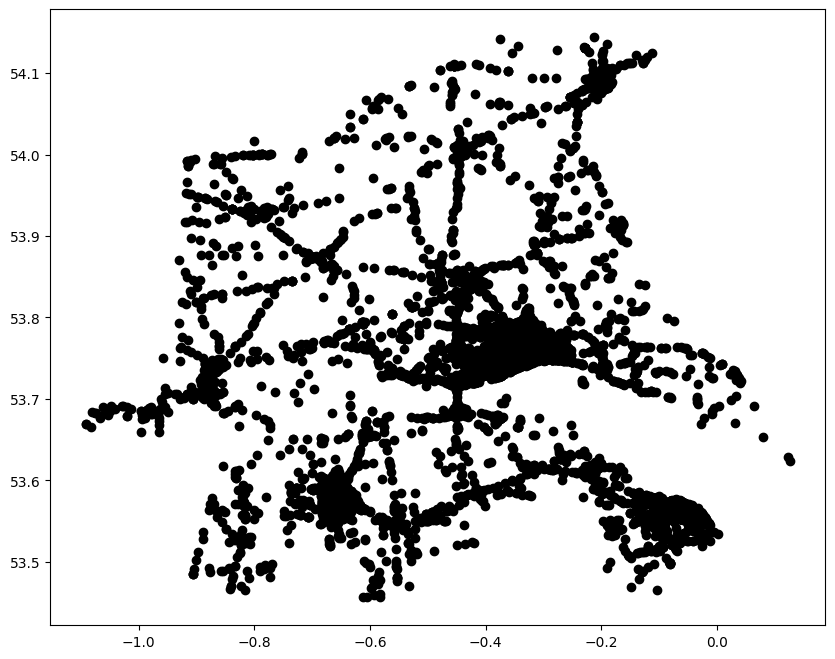

In [134]:
# visualize the data before applying clustering algorithm
plt.figure(figsize=(10,8))
plt.scatter(filtered_region_data['longitude'], filtered_region_data['latitude'], color='black')
plt.show()

### Standardize Data
- Standardize data using StandardScaler which tranforms the data to a range of 0 and 1 representing the mean and standard deviation respectively 

### Apply Clustering Algorithm

In [135]:
# import standard scaler
from sklearn.preprocessing import StandardScaler

In [136]:
# extract longitude and latitude for clustering
geo_data = filtered_region_data[['longitude', 'latitude']]


In [137]:
# instantiate min max scaler
scaler = StandardScaler()

In [138]:
# standardize and fit data using min max scaler
scaled_geo_data = scaler.fit_transform(geo_data)
# examine scaled data
scaled_geo_data

array([[ 0.04166484,  0.29355653],
       [ 0.04504622,  0.26393073],
       [ 0.04374396,  0.27507404],
       ...,
       [-1.30055041, -0.96665638],
       [-1.3471488 , -0.93456479],
       [-1.32065907, -0.93288457]])

According to this article [https://www.studocu.com/en-ca/messages/question/6329190/which-of-the-following-statements-are-true-about-dbscan-select-all-that-apply-question-34#:~:text=hierarchy%20of%20clusters.-,DBSCAN%20can%20be%20used%20when%20examining%20spatial%20data.,%27density%27%20to%20form%20clusters.], Density-Based Spatial Clustering of Applications with Noise (DBSCAN) works well with geographic data and hence informed my choice of clustering algorithm.

**Density-based spatial clustering of applications with noise:**
- In a nutshell: the algorithm thinks of clusters as high density areas
that are separated from each other by lower density areas.
- This is a very generic approach and its strength is that is doesn’t
assume any particular shape for clusters (they can be very uneven or
irregular!).
- It is also yet another example of unsupervised learning

In order to decide on a value for eps, i would use the nearest neigbour in computing the distance to the nearest n neighbors for each point and plotting the distances. The elbow point indicates the value of epsilon i would take.

For the min_samples, A smaller value means that smaller groups of points can be considered as clusters, while a larger value will be more strict, requiring more points to form a cluster. I chose 10 which seems appropriate reasonable.

The nearest neighbor method is a common technique for selecting the value of eps.

You compute the distance from each point to its nearest neighbors and then plot these distances in ascending order.

The idea is to look for an elbow point in this plot (often referred to as the k-distance graph). The elbow indicates a point where the distances start to increase sharply, signaling the transition from dense regions (clusters) to sparse regions (noise or outliers).

This elbow corresponds to an appropriate eps value because it marks the threshold at which points that are far away from each other (and thus less likely to belong to the same cluster) begin to stand out.

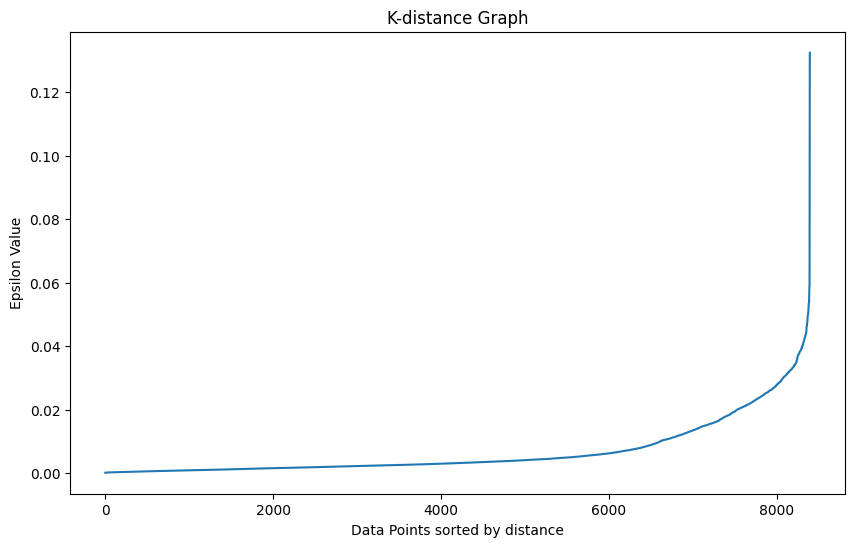

In [139]:
from sklearn.neighbors import NearestNeighbors

# extracting the longitude and latitude as the features for clustering
X = filtered_region_data[['longitude', 'latitude']]

# Using the NearestNeighbors to find the distance to the nearest 10 neighbors
nearest_neighbors = NearestNeighbors(n_neighbors=10)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)

# Sorting the distances and taking the distance to the 10th nearest neighbor (index 9)
distances = np.sort(distances, axis=0)
distances = distances[:,9] # Select the distance to the 10th nearest neighbor

# k-distance graph
plt.figure(figsize=(10,6))
plt.plot(distances)
plt.title('K-distance Graph')
plt.xlabel('Data Points sorted by distance')
plt.ylabel('Epsilon Value')
plt.show()

In [140]:
# Applying DBSCAN clustering
dbscan = DBSCAN(eps=0.04, min_samples=10)
clusters = dbscan.fit_predict(scaled_geo_data)

# Adding cluster labels to the dataframe
filtered_region_data['cluster'] = clusters
filtered_region_data

,accident_index,longitude,latitude,lsoa01nm,cluster
0,2017160211831,-0.374468,53.758694,Kingston upon Hull 025A,0
1,2018160279139,-0.373715,53.754621,Kingston upon Hull 025A,0
2,2018160301049,-0.374005,53.756153,Kingston upon Hull 025A,0
3,2018160302278,-0.373463,53.755256,Kingston upon Hull 025A,0
4,2018160339633,-0.373480,53.753243,Kingston upon Hull 025A,0
...,...,...,...,...,...
8390,2019160912658,-0.683850,53.588862,North Lincolnshire 009D,31
8391,2020160957934,-0.673140,53.586398,North Lincolnshire 009D,31
8392,2020160974614,-0.673366,53.585438,North Lincolnshire 009D,31
8393,2020160995951,-0.683743,53.589850,North Lincolnshire 009D,31


In [141]:
# examine number of unique clusters 
unique_clusters = np.unique(clusters)

# exclude the noise points (label -1)
num_clusters = len(unique_clusters[unique_clusters != -1])

print(f"Number of clusters: {num_clusters}")

Number of clusters: 44


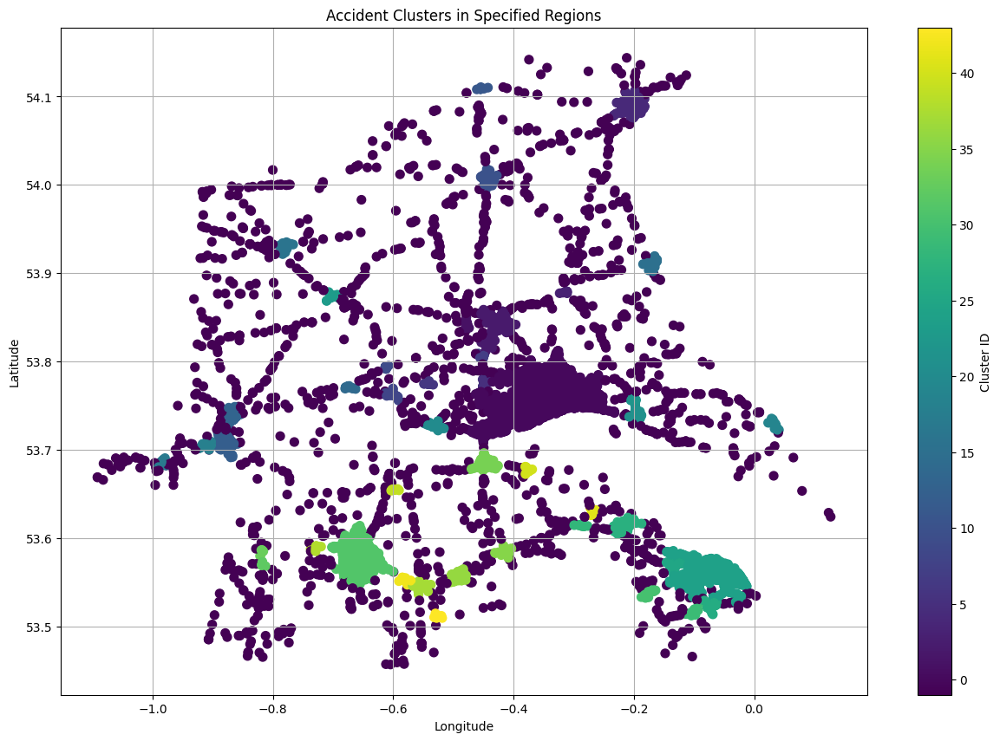

In [142]:
# plot clusters using matplotlib
plt.figure(figsize=(15, 10))
plt.scatter(filtered_region_data['longitude'], filtered_region_data['latitude'], c=filtered_region_data['cluster'], cmap='viridis', s=50)
plt.colorbar(label='Cluster ID')
plt.title('Accident Clusters in Specified Regions')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


In [143]:
"""This function maps the chosen Lower Layer Super Output regions to the broader regions
"""
def map_to_broad_region(lsoa):
    if "Kingston upon Hull" in lsoa:
        return "Kingston upon Hull"
    elif "East Riding of Yorkshire" in lsoa:
        return "East Riding of Yorkshire"
    elif "North East Lincolnshire" in lsoa:
        return "North East Lincolnshire"
    elif "North Lincolnshire" in lsoa:
        return "North Lincolnshire"

# apply function to the 'lsoa01nm' column to create a new column 'broad_region'
filtered_region_data['broad_region'] = filtered_region_data['lsoa01nm'].apply(map_to_broad_region)


C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.Categorica

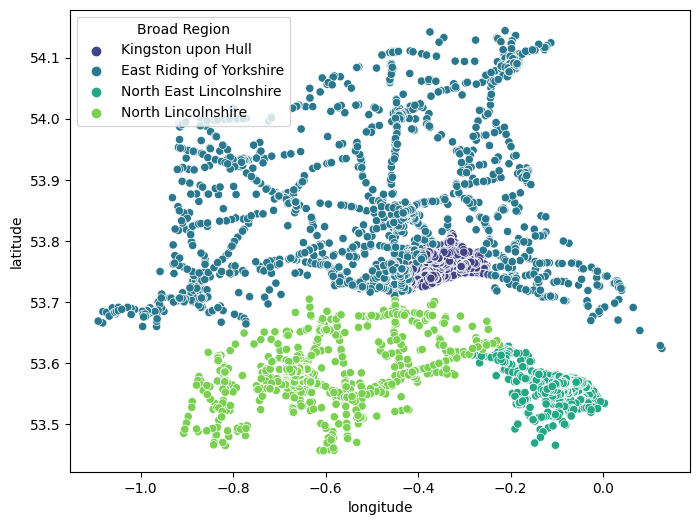

In [144]:
# plot the broader region
fig, ax = plt.subplots(figsize=(8, 6))

# use seaborn to scatter plot with hue as broad_region
sns.scatterplot(data=filtered_region_data, x='longitude', y='latitude', hue='broad_region', palette='viridis', ax=ax)

# display legend
ax.legend(title='Broad Region')

plt.show()

In [145]:
# group by broad_region and count the number of accidents
accidents_per_region = filtered_region_data.groupby('broad_region').size()

# find the region with the highest number of accidents
region_with_highest_accidents = accidents_per_region.idxmax()
number_of_accidents = accidents_per_region.max()

print(f"The broad region with the highest number of accidents is '{region_with_highest_accidents}' with {number_of_accidents} accidents.")


The broad region with the highest number of accidents is 'Kingston upon Hull' with 2776 accidents.


In [146]:
# examine accidents per region
accidents_per_region

broad_region
East Riding of Yorkshire    2548
Kingston upon Hull          2776
North East Lincolnshire     1546
North Lincolnshire          1525
dtype: int64

## Evaluate DBSCAN Cluster
- Using Silhouette Coefficient and Davies Bouldin Index

 **Davies-Bouldin (DB) Index**
- An internal evaluation measure based on the ratio of within-cluster to between-cluster separations.
- The smaller the DB value, the better the clustering, as it implies that the clusters are well separated (i.e. the distance -between clusters is large), and the points within each cluster are compact (i.e. they have a small spread).

  **Silhouette Coefficient**
- A measure of both cohesion and separation of cluster. The silhouette coefficient varies from –1 to +1.
- A value close to +1 means the data point is much closer to the points in its own cluster. This indicates good clustering.
- A value close to zero means the data point is close to the boundary between two clusters.
- A value close to -1 means the datapoint is much closer to another cluster than its own, and may have been mis-identified

In [147]:
from sklearn.metrics import silhouette_score
s_score = silhouette_score(scaled_geo_data,  clusters)
print('The Silhouette Coefficient Score is:', s_score)

The Silhouette Coefficient Score is: 0.08764663415968259


In [148]:
from sklearn.metrics import davies_bouldin_score
db_score = davies_bouldin_score(scaled_geo_data, clusters)
print('The Davies Bouldin index Score is:', db_score)

The Davies Bouldin index Score is: 1.8379053361542383


**The DBSCAN Algorithm performed poorly in clustering accidents per region based on the Silhouette coefficient and Davies Bouldin scores, hence, a K-means clustering algorithm will be explored**

### K-Means Clustering Algorithm


In [149]:
# impot kmeans from sklearn
from sklearn.cluster import KMeans

In [150]:
# Train KMeans
kmeans = KMeans(n_clusters=2, random_state=50, verbose=1)
kmeans.fit_transform(scaled_geo_data)
print("Inertia:", kmeans.inertia_)

Initialization complete
Iteration 0, inertia 13902.95611453285.
Iteration 1, inertia 12816.979920808564.
Iteration 2, inertia 11235.174584647062.
Iteration 3, inertia 10965.474077954303.
Iteration 4, inertia 10953.753173010238.
Iteration 5, inertia 10953.33366959385.
Converged at iteration 5: center shift 2.3590713238107522e-06 within tolerance 9.999999999999991e-05.
Inertia: 10953.322460199366


#### Elbow method to determine optimal number of clusters

In [153]:
# Elbow Method to find the optimal number of clusters
k_values = range(1,11)
inertia_list = []

for k in k_values:
    kmeans_model = KMeans(n_clusters=k, random_state=42)
    kmeans_model.fit(scaled_geo_data)
    inertia_list.append(kmeans_model.inertia_)

inertia_list

[16789.999999999996,
 12321.29054352089,
 7301.344732924501,
 3536.6703412973975,
 2268.8745991906126,
 2008.550401085549,
 1645.87794755288,
 1494.0430480341827,
 1305.6725735976638,
 1118.096843908422]

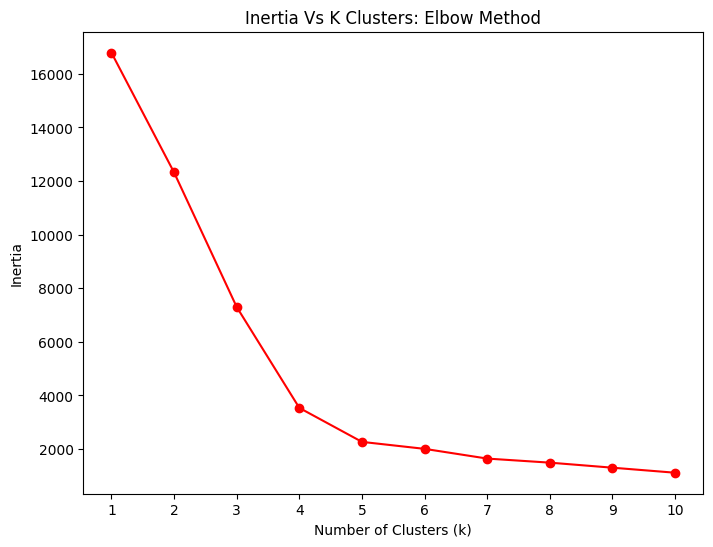

In [154]:
# Plot inertia vs. k (number of clusters)
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia_list, marker='o', linestyle='-', color='r')
plt.title("Inertia Vs K Clusters: Elbow Method")
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_values)  # Ensures all k values are displayed on the x-axis
plt.show()

- According to the above elbow method graph, the optimal number of clusters to use is 4. 

In [155]:
# fitting the final k-Means model using the number of clusters in graph plotted above (4)
# and
# Using model to predict the cluster labels of each data point in the dataset.
kmeans_model_eb = KMeans(n_clusters=4, random_state=42).fit(scaled_geo_data)
cluster_labels_pred = kmeans_model_eb.predict(scaled_geo_data)

In [156]:
# length of clustered labels
len(cluster_labels_pred)

8395

In [157]:
# print clusters
print(cluster_labels_pred)

[2 2 2 ... 1 1 1]


### Evaluate K-Means Algorithm

In [158]:
#calculate the Davies Bouldin index and the Silhoutte Coefficient
db_score_ = davies_bouldin_score(scaled_geo_data, cluster_labels_pred)
s_score_ = silhouette_score(scaled_geo_data, cluster_labels_pred)

In [159]:
print('The Davies Bouldin index Score is:', db_score_)
print('The Silhouette Coefficient is:', s_score_)

The Davies Bouldin index Score is: 0.6349129603496013
The Silhouette Coefficient is: 0.6198191359006646


C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Program Files\Python312\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


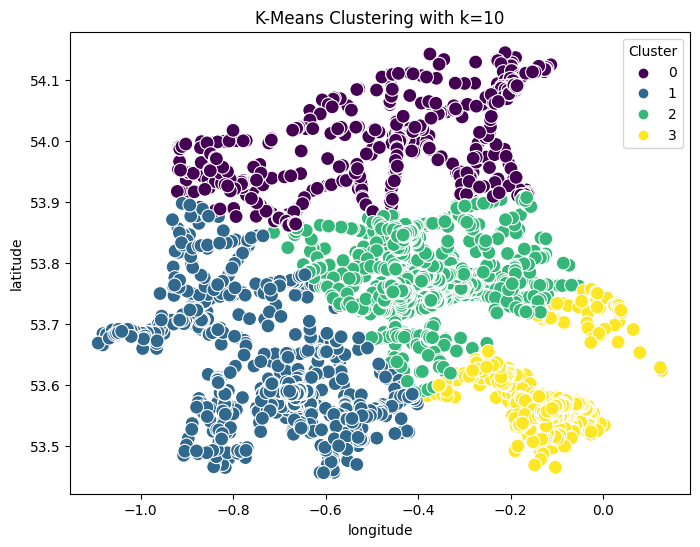

In [160]:
# Create a DataFrame with the data and predicted cluster labels
df = pd.DataFrame(filtered_region_data, columns=['longitude', 'latitude'])  # Assuming 2D data for visualization
df['Cluster'] = cluster_labels_pred

# Create a scatter plot using seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='longitude', y='latitude', hue='Cluster', palette='viridis', s=100, marker='o', legend='full')

# Set plot title and labels
plt.title(f'K-Means Clustering with k={k}')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.legend(title='Cluster', loc='upper right')

# Show the plot
plt.show()

In [161]:
filtered_region_data

,accident_index,longitude,latitude,lsoa01nm,cluster,broad_region
0,2017160211831,-0.374468,53.758694,Kingston upon Hull 025A,0,Kingston upon Hull
1,2018160279139,-0.373715,53.754621,Kingston upon Hull 025A,0,Kingston upon Hull
2,2018160301049,-0.374005,53.756153,Kingston upon Hull 025A,0,Kingston upon Hull
3,2018160302278,-0.373463,53.755256,Kingston upon Hull 025A,0,Kingston upon Hull
4,2018160339633,-0.373480,53.753243,Kingston upon Hull 025A,0,Kingston upon Hull
...,...,...,...,...,...,...
8390,2019160912658,-0.683850,53.588862,North Lincolnshire 009D,31,North Lincolnshire
8391,2020160957934,-0.673140,53.586398,North Lincolnshire 009D,31,North Lincolnshire
8392,2020160974614,-0.673366,53.585438,North Lincolnshire 009D,31,North Lincolnshire
8393,2020160995951,-0.683743,53.589850,North Lincolnshire 009D,31,North Lincolnshire


### Apply clusters to live Map of selected regions
- Use a library called folium.
- Import Marker Cluster from Folium

In [162]:
# pip install folium
!pip install folium


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable


In [163]:
# import folium
import folium

# import MarkerCluster from folium
from folium.plugins import MarkerCluster
 
# define colors for each cluster

cluster_colors = {

    0: 'blue',

    1: 'yellow',

    2: 'purple',

    3: 'red'

}
 
# create a map centered around the region

cluster_map = folium.Map(location=[filtered_region_data['latitude'].mean(), filtered_region_data['longitude'].mean()], zoom_start=11)
 
#adding accidents to the map with cluster-specific colors

for _, row in filtered_region_data.iterrows():

    cluster_color = cluster_colors.get(row['cluster'], 'black')  # default to black if cluster is not in the dictionary

    folium.CircleMarker(

        location=[row['latitude'], row['longitude']],

        radius=5,

        color=cluster_color,

        fill=True,

        fill_color=cluster_color,

        fill_opacity=0.8

    ).add_to(cluster_map)
 
#saving or display the map

cluster_map.save('cluster_map.html')

cluster_map
 

## Question 6: Choose three policing areas by filtering the data using the "police_force" column, then create time series models to predict weekly accident counts for the upcoming year based on historical data from 2017 to 2019.

In [164]:
# examine unique values using previously labeled accident data
accident_data_label.police_force.unique()

array(['Metropolitan Police', 'Cumbria', 'Lancashire', 'Merseyside',
       'Greater Manchester', 'Cheshire', 'Northumbria', 'Durham',
       'North Yorkshire', 'West Yorkshire', 'South Yorkshire',
       'Humberside', 'Cleveland', 'West Midlands', 'Staffordshire',
       'West Mercia', 'Warwickshire', 'Derbyshire', 'Nottinghamshire',
       'Lincolnshire', 'Leicestershire', 'Northamptonshire',
       'Cambridgeshire', 'Norfolk', 'Suffolk', 'Bedfordshire',
       'Hertfordshire', 'Essex', 'Thames Valley', 'Hampshire', 'Surrey',
       'Kent', 'Sussex', 'City of London', 'Devon and Cornwall',
       'Avon and Somerset', 'Gloucestershire', 'Wiltshire', 'Dorset',
       'North Wales', 'Gwent', 'South Wales', 'Dyfed-Powys',
       'Police Scotland'], dtype=object)

- Selected policing areas are Humberside, South Yorkshire, City of London

#### SQL Command Query accident data and filter for years 2017 - 2019 

- There are 52 distinct forces
- Code representation of selected policing areas are:
-  Humberside: 16,
-  South Yorkshire 14,
-  City of London: 48

### Humberside Weekly Accidents Time Series Forecast Using SARIMA, Arima and Naive (baseline model) and Xgboost

In [295]:
# Execute the SQL query and get the result
results = cur.execute('''
SELECT date, police_force, accident_index 
FROM accident
WHERE police_force IN (16)
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all the results from the query
results = cur.fetchall()

# Create a DataFrame from the results
df_humberside = pd.DataFrame(results, columns=['date', 'police_force', 'accident_index'])

# Convert the 'date' column to datetime format
df_humberside['date'] = pd.to_datetime(df_humberside['date'], dayfirst=True)

# Display the first few rows of the DataFrame
df_humberside.head()


,date,police_force,accident_index
0,2017-01-06,16,2017160143153
1,2017-01-02,16,2017160143158
2,2017-01-01,16,2017160143161
3,2017-01-02,16,2017160143167
4,2017-01-01,16,2017160143188


In [296]:
# examine tail of df
df_humberside.tail()

,date,police_force,accident_index
6939,2019-06-11,16,2019160930465
6940,2019-12-17,16,2019160932150
6941,2019-11-06,16,2019160948283
6942,2019-11-25,16,2019160950532
6943,2019-08-09,16,2019162000110


In [297]:
# Set 'date' as index
df_humberside.set_index('date', inplace=True)

# Aggregate weekly accident counts
weekly_accidents = df_humberside.groupby(['police_force']).resample('W').size().unstack(level=0)
 
weekly_accidents = df_humberside.resample('W').size().reset_index(name = 'accident_count')
 
# Set 'date' as index
weekly_accidents.set_index('date', inplace=True)
 
# remove first and last row which represnets first week in 2020
weekly_accidents = weekly_accidents[1:-1]

# Display DataFrame
weekly_accidents

,accident_count
date,
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
2017-02-05,39
...,...
2019-12-01,55
2019-12-08,59
2019-12-15,46


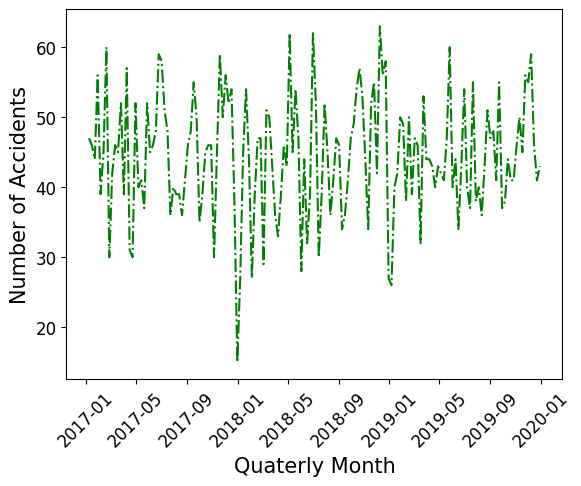

In [298]:
# Visualisation of the data
plt.plot(weekly_accidents.index, weekly_accidents['accident_count'], 'g-.')

# Adding labels and title
plt.xlabel('Quaterly Month', fontsize=15)
plt.ylabel('Number of Accidents', fontsize=15)

# Formatting the ticks on x and y axis
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Display the plot
plt.show()

### Decompose Series to check for trend and seasonality

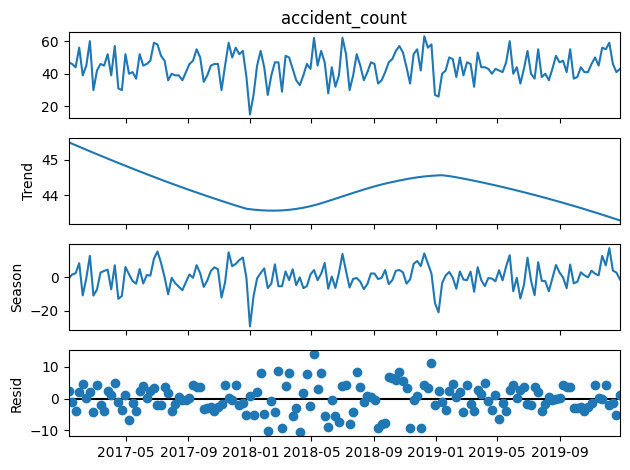

In [299]:
# Decomposition of the series 
from statsmodels.tsa.seasonal import STL  

STL(weekly_accidents['accident_count']).fit().plot()
plt.show()

#### Investigate time series data to cehck for non-stationarity
- Using Augmented-Dickey Fuller test
- Augmented Dickey-Fuller (ADF) Test (p-value most be less than 0.05) to reject null hypothesis of non-stationarity else we perform differencing

In [300]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents['accident_count'])

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -7.280255810296709; p-value 1.5069074202890945e-10


Given the ADF Statistic: ADF Statistic: -7.227422306149102; p-value 2.035829637553865e-10, we can reject the null hypothesis and conclude that the time series is stationary. There is strong evidence that the data does not have a unit root and does not require further differencing to achieve stationarity.

### To further understand the series, plot correlation and autocorrelation

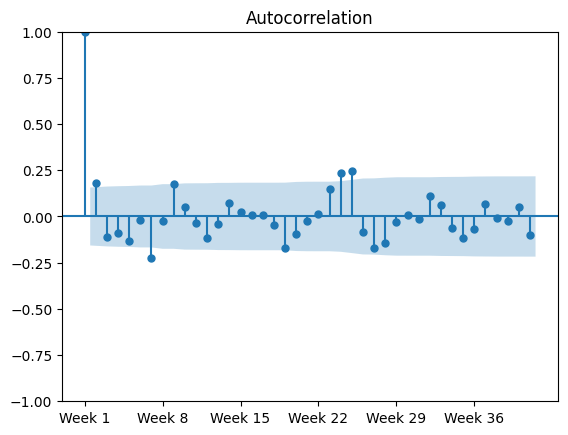

In [301]:
# Plot ACF
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

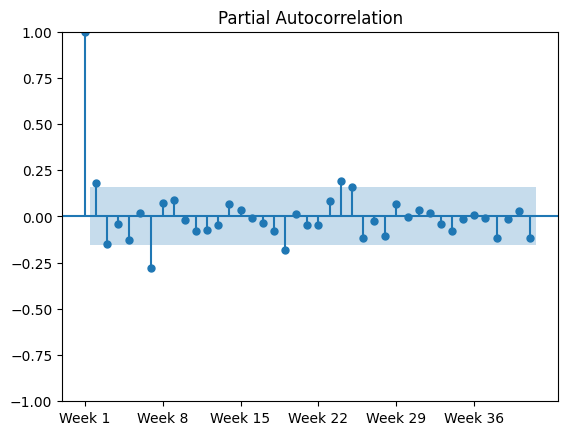

In [302]:
# Plot PACF
plot_pacf(weekly_accidents['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

ACF Cutoff, PACF Decay: Suggests an MA process.

PACF Cutoff, ACF Decay: Suggests an AR process.

Both ACF and PACF Decay: Suggests a mixed ARMA process.

The spike in ACF value 7 lags and spike at 7 on PACF plot (with all other values insignificant) confirm m=52.

### Build Seasonal Arima Model

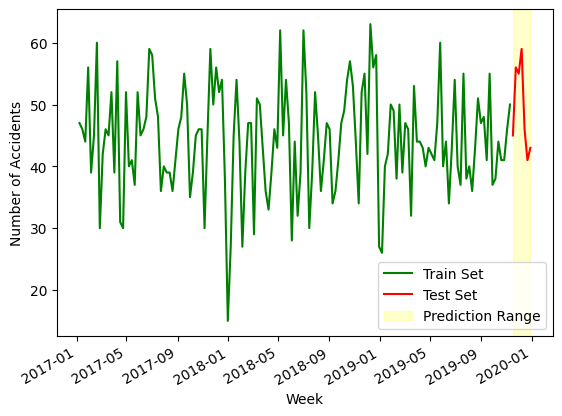

In [309]:
import matplotlib.pyplot as plt

# Splitting the dataset into train and test sets
train = weekly_accidents[:-7]  # All weeks before the last 7 weeks
test = weekly_accidents[-7:]   # Last 7 weeks for prediction

# Creating the plot
fig, ax = plt.subplots()

# Plotting the train and test sets
ax.plot(train.index, train['accident_count'], 'g-', label='Train Set')  # Train set in green
ax.plot(test.index, test['accident_count'], 'r-', label='Test Set')  # Test set in red

# Labeling the axes
ax.set_xlabel('Week')
ax.set_ylabel('Number of Accidents')

# Highlighting the range (example, adjust to your specific needs)
ax.axvspan(test.index[0], test.index[-1], alpha=0.2, color='yellow', label='Prediction Range')

# Formatting the x-axis labels to make them more readable
fig.autofmt_xdate()

# Adding legend
plt.legend()

# Show the plot
plt.show()


In [310]:
# examine head of test data
test.head()

,accident_count
date,
2019-11-17,45
2019-11-24,56
2019-12-01,55
2019-12-08,59
2019-12-15,46


In [311]:
# examine head of train data
train.head()

,accident_count
date,
2017-01-08,47
2017-01-15,46
2017-01-22,44
2017-01-29,56
2017-02-05,39


In [312]:
test.shape, train.shape

((7, 1), (149, 1))

### Building and Evaluating the Model
The Akaike information criterion (AIC) is a mathematical method for evaluating how well a model fits the data it was generated from. In statistics, AIC is used to compare different possible models and determine which one is the best fit for the data

In [303]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,10,1) # Order of AR
qs = np.arange(0,10,1) # Order of MA
Ps = [0] # Seasonal order of AR 
Qs = [0] # Seasonal order of MA 
d=0 # zero-order differencing
D = 0 # Seasonal differencing 
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

In [313]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress barfrom tqdm import tqdm # to show progress bar

# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=train, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[2], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.37it/s]


In [314]:
# examine aic dataframe
aic_df

,"Order(p,q,Ps,QS)",AIC
71,"(7, 1, 0, 0)",1063.606300
81,"(8, 1, 0, 0)",1064.825998
91,"(9, 1, 0, 0)",1065.830986
72,"(7, 2, 0, 0)",1065.992661
93,"(9, 3, 0, 0)",1066.925267
...,...,...
4,"(0, 4, 0, 0)",1263.506654
3,"(0, 3, 0, 0)",1272.476536
2,"(0, 2, 0, 0)",1335.018532
1,"(0, 1, 0, 0)",1401.005463


In [315]:
# check minimum AIC value
aic_df['AIC'].min()

1063.6062998542839

In [316]:
# check length of models
len(aic_df)

100

The lowest AIC value is 1063.60 ar(p) p=7, and ma(q) q=1 (from the first row of above dataframe). I used d=0 because the ADF Test revealed that the data was already stationary with p < 0.05.

In [317]:
# import SARIMAX Model
from statsmodels.tsa.statespace.sarimax import SARIMAX

# fitting the ARIMA model based on the lowest AIC, order(p,d,q)
sarima_model = SARIMAX(endog=train, order=(7,0,1),seasonal_order=(0, 0, 0, 52)).fit() # using original data for train, because differencing (d=2) taken care of during the model fitting.
print(sarima_model.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  149
Model:               SARIMAX(7, 0, 1)   Log Likelihood                -522.803
Date:                Fri, 04 Apr 2025   AIC                           1063.606
Time:                        17:31:31   BIC                           1090.642
Sample:                    01-08-2017   HQIC                          1074.590
                         - 11-10-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1826      0.009    130.040      0.000       1.165       1.200
ar.L2         -0.3986      0.084     -4.750      0.000      -0.563      -0.234
ar.L3          0.1902      0.133      1.431      0.1

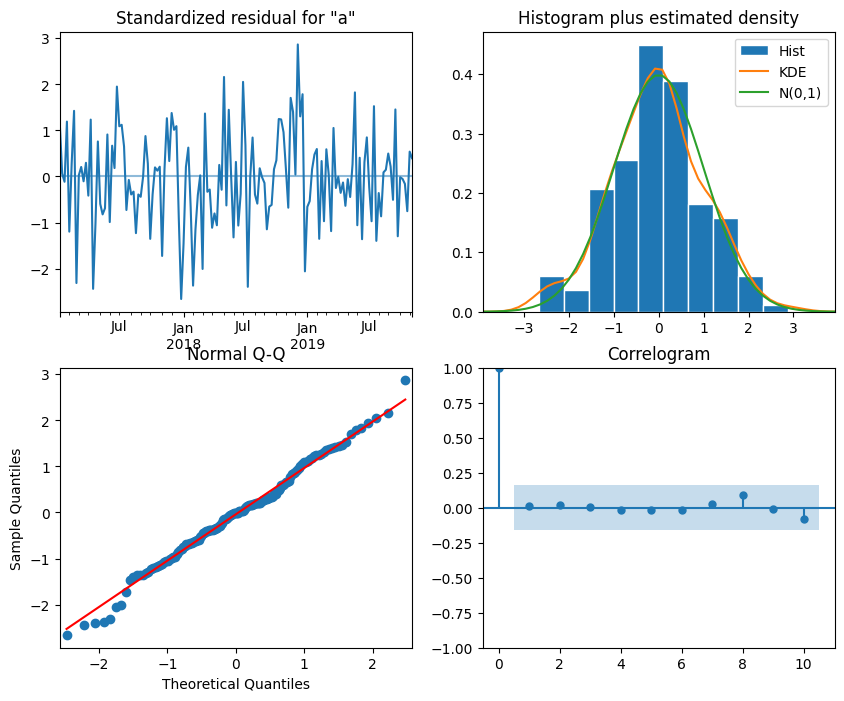

In [318]:
# plot of the Q-Q plot
sarima_model.plot_diagnostics(figsize=(10,8));

### Understanding Q-Q plot (ideal scenarios):
- top left corner: The residuals should appear to be randomly scattered around zero, with no obvious trends, patterns, or heteroscedasticity (unequal variance). The residuals should stay within a constant band around zero.

- top right corner: The histogram and density curve should resemble a normal distribution with a mean of 0. This indicates that the residuals are approximately normally distributed, which is an assumption of many time series models.

- bottom left corner: The points should fall approximately along a straight diagonal line. This indicates that the residuals are approximately normally distributed.

- bottom right corner: All autocorrelation coefficients should be within the blue shaded area (confidence interval), indicating that the residuals are uncorrelated.

### Evaluation using Ljung-Box test

**Ljung-Box test:**
The Ljung-Box test is a valuable tool for assessing the adequacy of time series models and detecting serial correlation in data.

- Null Hypothesis (H0):The data (typically the residuals of a time series model) are independently distributed (i.e., there is no significant serial correlation up to lag h). Alternative Hypothesis (H1): The data are not independently distributed (i.e., there is significant serial correlation up to lag h).

- Above dataframe points to significant correlation at lags 1 and 2 (p-value ≤ 0.05: Reject the Null Hypothesis.). There is no statistically significant serial correlation at these higher lags.

- Ideal Scenario: When you fit a time series model to your data, the goal is to capture all the systematic patterns and dependencies that exist in the data. Once you've done that, what's left over (the residuals) should be random and unpredictable – like white noise. White noise has no autocorrelation; each value is independent of the previous values.**It strongly indicates that the model is not adequately capturing the autocorrelation present in the data, specifically at the first two lags. The model needs to be improved to address this**. As seen earlier, the original is periodic and non-stationary, throguh the above modelling, we have not considered the seasonal (periodic) component of the time-series, and that's why the results are showing that the modelling in inadequate.



In [366]:
# Perform Ljung-Box test on the residuals
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.006188,0.937298
2,0.019798,0.990150
3,0.462538,0.927041
4,0.910094,0.923108
5,0.912540,0.969307
6,1.009607,0.985246
7,1.268738,0.989257
8,2.143793,0.976283
9,2.150457,0.988859
10,2.666417,0.988222


All lags (1-10) show no significant autocorrelation since the p-values are all greater than 0.05. This suggests that the residuals from the model are not white noise, meaning the model has not fully captured all the autocorrelations in the data.

In [367]:
# Making predictions with the model
sarima_pred = sarima_model.get_forecast(steps=52) # setting steps as 52 for the next year(2020) weekly. 
sarima_pred = sarima_pred.predicted_mean
# examine the predicted values for sarima model for Humberside region
sarima_pred

2019-11-17    47.308067
2019-11-24    43.879753
2019-12-01    43.630791
2019-12-08    43.989239
2019-12-15    43.570051
2019-12-22    42.737029
2019-12-29    43.238089
2020-01-05    44.418632
2020-01-12    44.725944
2020-01-19    44.540982
2020-01-26    44.373520
2020-02-02    44.423452
2020-02-09    44.356315
2020-02-16    44.056270
2020-02-23    43.945126
2020-03-01    44.022711
2020-03-08    44.133344
2020-03-15    44.178211
2020-03-22    44.179329
2020-03-29    44.230166
2020-04-05    44.254320
2020-04-12    44.224823
2020-04-19    44.184143
2020-04-26    44.159838
2020-05-03    44.163666
2020-05-10    44.163484
2020-05-17    44.161983
2020-05-24    44.171833
2020-05-31    44.183131
2020-06-07    44.190392
2020-06-14    44.188184
2020-06-21    44.183951
2020-06-28    44.182426
2020-07-05    44.179698
2020-07-12    44.177332
2020-07-19    44.176082
2020-07-26    44.177041
2020-08-02    44.179165
2020-08-09    44.180059
2020-08-16    44.180578
2020-08-23    44.180814
2020-08-30    44

### Arima Model
- Using the AIC values previously obtained above
- Removing the seasonal component since it is not needed for an Arima Model

In [368]:
from statsmodels.tsa.arima.model import ARIMA
arima_model0 = ARIMA(train, order=(7, 0, 1))  # p=1, d=0, q=8
model_fit0 = arima_model0.fit()

# Summary of the model
print(model_fit0.summary())

# Access the residuals for Arima Model
residuals0 = model_fit0.resid

# Apply Ljung-Box test
ljungbox_result = acorr_ljungbox(residuals0, lags=[10], return_df=True)

print(ljungbox_result)

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  149
Model:                 ARIMA(7, 0, 1)   Log Likelihood                -517.056
Date:                Fri, 04 Apr 2025   AIC                           1054.112
Time:                        17:59:23   BIC                           1084.151
Sample:                    01-08-2017   HQIC                          1066.316
                         - 11-10-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         44.1967      0.573     77.136      0.000      43.074      45.320
ar.L1          0.5493      0.835      0.658      0.510      -1.087       2.185
ar.L2         -0.2853      0.170     -1.675      0.0

In [369]:
# Forecasting for the next 'len_test' periods - 52 weeks
len_test = len(test)
arima_pred0 = model_fit0.forecast(steps=len_test)
test['arima_pred0'] = arima_pred0

### Performance Evaluation
These are metrics that measure how close the predicted values are to the actual values

- **Mean Absolute Error:** Provides a straightforward average of error magnitude
- **Mean Squared Error:** Penalizes larger errors more due to squaring

SARIMA RMSE: 8.58, MAE: 6.46
ARIMA RMSE: 8.77, MAE: 6.67
Naive RMSE: 11.54, MAE: 10.29


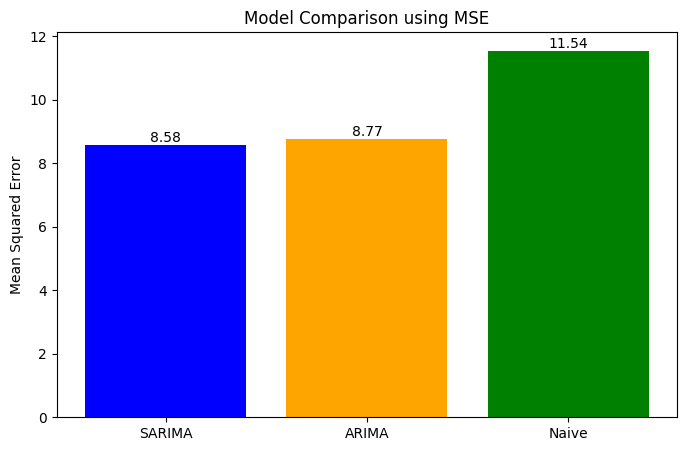

In [371]:
# import MAE and MSE
from sklearn.metrics import mean_squared_error, mean_absolute_error

def evaluate_models(train, test):
    # Mean Squared Error (MSE) calculations
    sarima_mse = mean_squared_error(test['accident_count'], test['sarima_pred'], squared=False)
    arima_mse = mean_squared_error(test['accident_count'], test['arima_pred0'], squared=False)

    # Naive model prediction
    test['naive_pred'] = train['accident_count'][-7:].values
    naive_mse = mean_squared_error(test['accident_count'], test['naive_pred'], squared=False)

    # Mean Absolute Error (MAE) calculations
    sarima_mae = mean_absolute_error(test['accident_count'], test['sarima_pred'])
    arima_mae = mean_absolute_error(test['accident_count'], test['arima_pred0'])
    naive_mae = mean_absolute_error(test['accident_count'], test['naive_pred'])

    # Display errors
    print(f"SARIMA RMSE: {sarima_mse:.2f}, MAE: {sarima_mae:.2f}")
    print(f"ARIMA RMSE: {arima_mse:.2f}, MAE: {arima_mae:.2f}")
    print(f"Naive RMSE: {naive_mse:.2f}, MAE: {naive_mae:.2f}")

    # Plot RMSE comparison
    list_mse = [sarima_mse, arima_mse, naive_mse]
    models = ['SARIMA', 'ARIMA', 'Naive']

    plt.figure(figsize=(8, 5))
    plt.bar(models, list_mse, color=['blue', 'orange', 'green'])
    plt.ylabel('Mean Squared Error')
    plt.title('Model Comparison using MSE')

    for i, value in enumerate(list_mse):
        plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

    plt.show()

    return {
        "SARIMA": {"RMSE": sarima_mse, "MAE": sarima_mae},
        "ARIMA": {"RMSE": arima_mse, "MAE": arima_mae},
        "Naive": {"RMSE": naive_mse, "MAE": naive_mae}
    }

# Usage:
results = evaluate_models(train, test)


## XGBOOST Model
- pip install the model package
- Import the Model as xgb

In [191]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [192]:
import xgboost as xgb

Root Mean Squared Error (RMSE): 9.354049148277166
Mean Absolute Error (MAE): 7.792318820953369


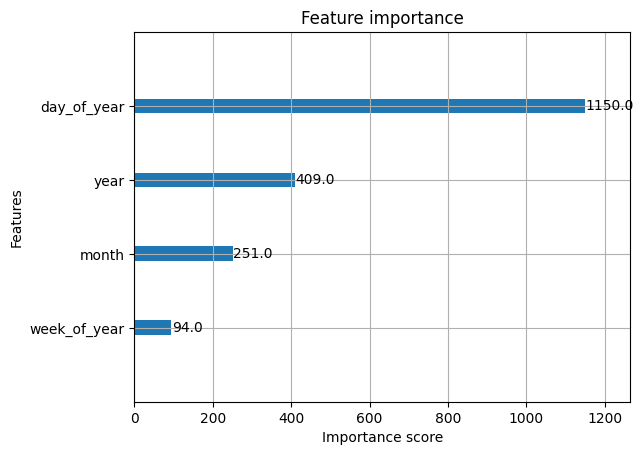

In [193]:
# Ensure the index of weekly_accidents is a DatetimeIndex
weekly_accidents.index = pd.to_datetime(weekly_accidents.index)

# Extract features from the index
X = weekly_accidents.drop(columns=['accident_count'])  # Features (all columns except 'accident_count')
y = weekly_accidents['accident_count']  # Target (accident count)

# Extract time-based features
X['day_of_week'] = X.index.dayofweek  # 0=Monday, 6=Sunday
X['month'] = X.index.month  # Extract the month
X['year'] = X.index.year  # Extract the year
X['day_of_year'] = X.index.dayofyear  # Extract the day of the year
X['week_of_year'] = X.index.isocalendar().week  # Extract the week number of the year

# Split the data into train and test sets (70% train, 30% test)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Convert the data into DMatrix format for XGBoost
import xgboost as xgb
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Define hyperparameters for the XGBoost model
params = {
    'objective': 'reg:squarederror',  # For regression tasks
    'eval_metric': 'rmse',  # Metric to evaluate
    'max_depth': 6,  # Maximum depth of the tree
    'learning_rate': 0.1,  # Step size
    'n_estimators': 100  # Number of boosting rounds
}

# Train the XGBoost model
num_round = 100  # Number of boosting rounds
bst = xgb.train(params, dtrain, num_round)

# Make predictions on the test set
y_pred = bst.predict(dtest)

# import MSE and MAE
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Evaluate the model using MSE
rmse_xgboost = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE): {rmse_xgboost}')

# Evaluate the model using MAE
mae_xgboost = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE): {mae_xgboost}')

# Plot feature importance
import matplotlib.pyplot as plt
xgb.plot_importance(bst)
plt.show()


In [194]:
# examine the predictor features (x)
X

,day_of_week,month,year,day_of_year,week_of_year
date,,,,,
2017-01-01,6,1,2017,1,52
2017-01-08,6,1,2017,8,1
2017-01-15,6,1,2017,15,2
2017-01-22,6,1,2017,22,3
2017-01-29,6,1,2017,29,4
...,...,...,...,...,...
2019-12-01,6,12,2019,335,48
2019-12-08,6,12,2019,342,49
2019-12-15,6,12,2019,349,50


In [195]:
# examine the target feature (y)
y

date
2017-01-01     2
2017-01-08    47
2017-01-15    46
2017-01-22    44
2017-01-29    56
              ..
2019-12-01    55
2019-12-08    59
2019-12-15    46
2019-12-22    41
2019-12-29    43
Name: accident_count, Length: 157, dtype: int64

**The Arima has the lowest Mean Square Error**

### South Yorkshire Weekly Accident Time Series Forecast Modeling using Sarima, Arima and Naive (baseline model)

In [196]:
# Execute the SQL query and get the result for south yorkshire
results = cur.execute('''
SELECT date, police_force, accident_index 
FROM accident
WHERE police_force IN (14)
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all the results from the query
results = cur.fetchall()

# Create a DataFrame from the results
df_south_yorkshire = pd.DataFrame(results, columns=['date', 'police_force', 'accident_index'])

# Convert the 'date' column to datetime format
df_south_yorkshire['date'] = pd.to_datetime(df_south_yorkshire['date'], dayfirst=True)

# Display the first few rows of the DataFrame
df_south_yorkshire

,date,police_force,accident_index
0,2017-01-02,14,2017140141597
1,2017-01-06,14,2017140143135
2,2017-01-08,14,2017140143882
3,2017-01-07,14,2017140144129
4,2017-01-11,14,2017140144285
...,...,...,...
7635,2019-08-30,14,2019140940869
7636,2019-12-31,14,2019140941612
7637,2019-10-15,14,2019140947269
7638,2019-12-29,14,2019140951634


In [197]:
df_south_yorkshire.police_force.unique()

array([14], dtype=int64)

In [198]:
## Set 'date' as index
df_south_yorkshire.set_index('date', inplace=True)
 
# Aggregate weekly accident counts
weekly_accidents_s = df_south_yorkshire.groupby(['police_force']).resample('W').size().unstack(level=0)
 
weekly_accidents_s = df_south_yorkshire.resample('W').size().reset_index(name = 'accident_count')
 
# Set 'date' as index
weekly_accidents_s.set_index('date', inplace=True)
 
# remove last row which represnets first week in 2020
weekly_accidents_s = weekly_accidents_s[:-1]

# Display DataFrame
weekly_accidents_s

,accident_count
date,
2017-01-01,4
2017-01-08,49
2017-01-15,80
2017-01-22,47
2017-01-29,72
...,...
2019-12-01,48
2019-12-08,68
2019-12-15,49


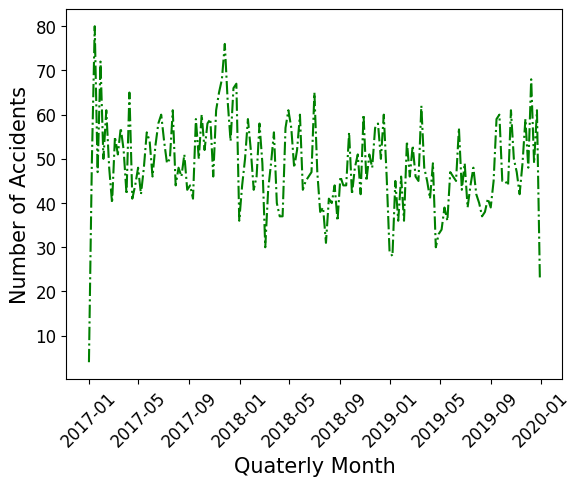

In [199]:
# Visualisation of the data
plt.plot(weekly_accidents_s.index, weekly_accidents_s['accident_count'], 'g-.')

# Adding labels and title
plt.xlabel('Quaterly Month', fontsize=15)
plt.ylabel('Number of Accidents', fontsize=15)

# Formatting the ticks on x and y axis
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Display the plot
plt.show()

### Decompose Series to check for trend and seasonality

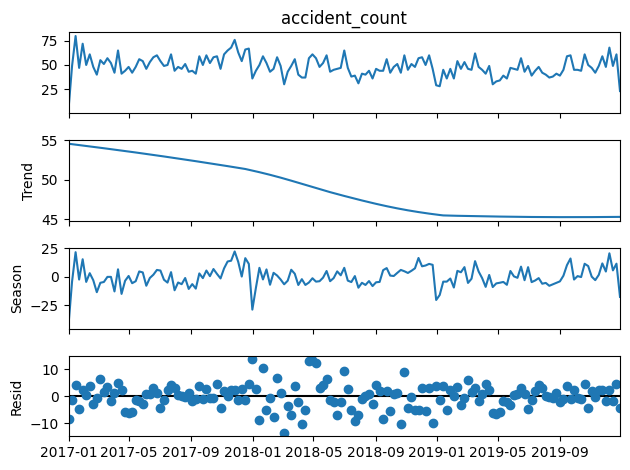

In [200]:
# Decomposition of the series 
from statsmodels.tsa.seasonal import STL  

STL(weekly_accidents_s['accident_count']).fit().plot()
plt.show()

#### Investigate time series data to cehck for non-stationarity
- Using Augmented-Dickey Fuller test
- Augmented Dickey-Fuller (ADF) Test (p-value most be less than 0.05) to reject null hypothesis of non-stationarity else we perform differencing

In [201]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents_s['accident_count'])

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -4.42088425979017; p-value 0.0002725649157449059


Given the ADF Statistic: ADF Statistic: ADF Statistic: -7.157174383359405; p-value 3.0334158227965064e-10, we can reject the null hypothesis and conclude that the time series is stationary. There is strong evidence that the data does not have a unit root and does not require further differencing to achieve stationarity.

### To further understand the series, Plot Autocorrelation and Partial Autocorrelation

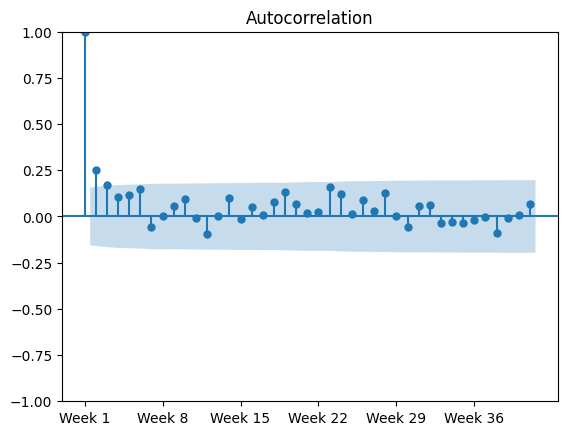

In [202]:
# Plot ACF
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents_s['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

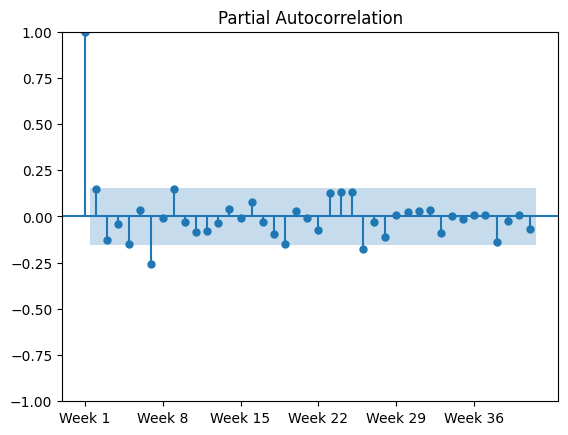

In [203]:
# Plot PACF
plot_pacf(weekly_accidents['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

## Build Seasonal Arima Model

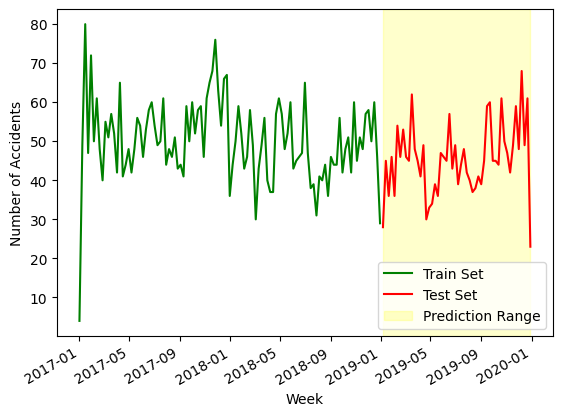

In [204]:
# Splitting the dataset into train and test sets
train_s = weekly_accidents_s[['accident_count']][:len(weekly_accidents) - 52]  # All weeks before the last 7 weeks
test_s = weekly_accidents_s[['accident_count']][-52:]  # Last 7 weeks for prediction

# Creating the plot
fig, ax = plt.subplots()

# Plotting the train and test sets
ax.plot(train_s.index, train_s['accident_count'], 'g-', label='Train Set')  # Train set in green
ax.plot(test_s.index, test_s['accident_count'], 'r-', label='Test Set')  # Test set in red

# Labeling the axes
ax.set_xlabel('Week')
ax.set_ylabel('Number of Accidents')

# Highlighting the range (example, adjust to your specific needs)
ax.axvspan(test_s.index[0], test_s.index[-1], alpha=0.2, color='yellow', label='Prediction Range')

# Formatting the x-axis labels to make them more readable
fig.autofmt_xdate()

# Adding legend
plt.legend()

# Show the plot
plt.show()

### Building and Evaluating the Model
- The Akaike information criterion (AIC) is a mathematical method for evaluating how well a model fits the data it was generated from. In statistics, AIC is used to compare different possible models (p,q values) and determine which one is the best fit for the data



In [205]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,10,1) # Order of AR
qs = np.arange(0,10,1) # Order of MA
Ps = [0] # Seasonal order of AR 
Qs = [0] # Seasonal order of MA 
d=0 # zero-order differencing
D = 0 # Seasonal differencing 
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

In [206]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress barfrom tqdm import tqdm # to show progress bar

# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=train_s, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[2], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train_s)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


In [207]:
aic_df

,"Order(p,q,Ps,QS)",AIC
18,"(1, 8, 0, 0)",798.389502
19,"(1, 9, 0, 0)",799.357505
12,"(1, 2, 0, 0)",800.515177
21,"(2, 1, 0, 0)",800.597353
27,"(2, 7, 0, 0)",800.759139
...,...,...
3,"(0, 3, 0, 0)",911.925632
4,"(0, 4, 0, 0)",929.421133
2,"(0, 2, 0, 0)",969.232934
1,"(0, 1, 0, 0)",1019.615876


The lowest AIC value is 798.38for the lowest AIC value - p=1, q=8 (from the first row of above dataframe). I used d=0 because the ADF Test revealed that the data was already stationary with p < 0.05.


In [208]:
# import SARIMAX Model
from statsmodels.tsa.statespace.sarimax import SARIMAX

# fitting the SARIMA model based on the lowest AIC, order(p,d,q)
sarima_model1 = SARIMAX(endog=train_s, order=(1,0,8), seasonal_order=(0,0,0,52)).fit()  # Close the parentheses properly
print(sarima_model1.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  105
Model:               SARIMAX(1, 0, 8)   Log Likelihood                -389.195
Date:                Fri, 04 Apr 2025   AIC                            798.390
Time:                        17:06:54   BIC                            824.929
Sample:                    01-01-2017   HQIC                           809.144
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999      0.000   3614.886      0.000       0.999       1.000
ma.L1         -0.6244      0.091     -6.829      0.000      -0.804      -0.445
ma.L2         -0.1100      0.102     -1.079      0.2

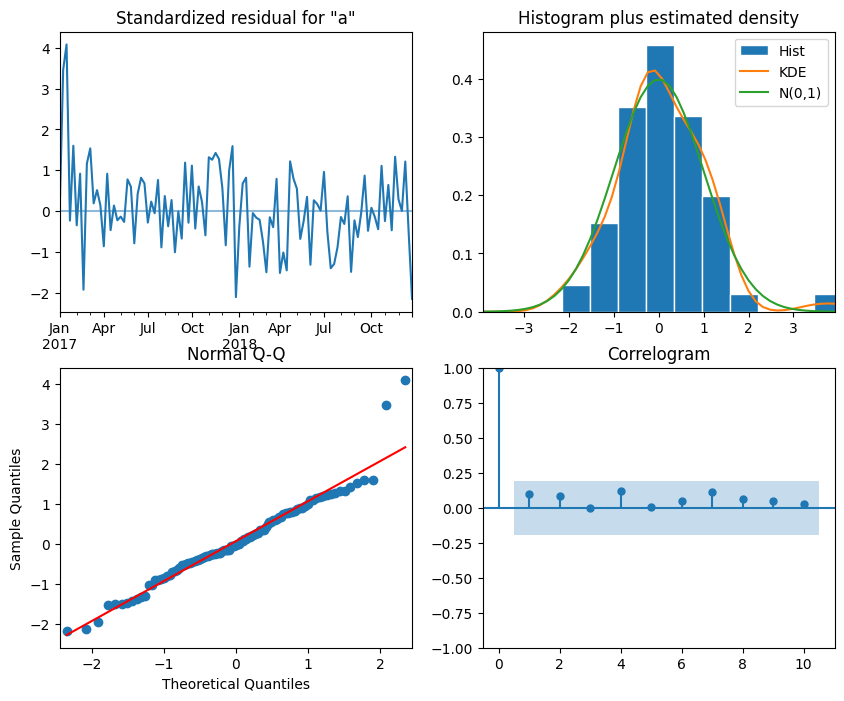

In [209]:
# plot of the Q-Q plot
sarima_model1.plot_diagnostics(figsize=(10,8));

### Ljung-Box test

In [210]:
# Perform Ljung-Box test on the residuals
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model1.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,2.604788,0.106541
2,3.840091,0.146600
3,3.852966,0.277785
4,5.327777,0.255288
5,5.333579,0.376540
6,5.436411,0.489175
7,7.006658,0.428187
8,7.723843,0.460900
9,7.997929,0.534355
10,8.135558,0.615598


In [211]:
# Making predictions with the model
len_test = len(test_s) # this also referred to as the window of forecast
sarima_pred1 = sarima_model1.get_forecast(len_test)
sarima_pred1 = sarima_pred1.predicted_mean

print(sarima_pred1)

2019-01-06    42.756985
2019-01-13    35.592260
2019-01-20    45.064772
2019-01-27    46.717225
2019-02-03    38.893300
2019-02-10    51.461300
2019-02-17    55.363565
2019-02-24    47.022188
2019-03-03    47.017595
2019-03-10    47.013003
2019-03-17    47.008411
2019-03-24    47.003819
2019-03-31    46.999228
2019-04-07    46.994637
2019-04-14    46.990047
2019-04-21    46.985457
2019-04-28    46.980868
2019-05-05    46.976279
2019-05-12    46.971691
2019-05-19    46.967103
2019-05-26    46.962515
2019-06-02    46.957928
2019-06-09    46.953341
2019-06-16    46.948755
2019-06-23    46.944169
2019-06-30    46.939584
2019-07-07    46.934999
2019-07-14    46.930415
2019-07-21    46.925831
2019-07-28    46.921247
2019-08-04    46.916664
2019-08-11    46.912081
2019-08-18    46.907499
2019-08-25    46.902917
2019-09-01    46.898336
2019-09-08    46.893755
2019-09-15    46.889175
2019-09-22    46.884595
2019-09-29    46.880015
2019-10-06    46.875436
2019-10-13    46.870858
2019-10-20    46

### Arima Model 

In [212]:
# import ARIMA Model
from statsmodels.tsa.arima.model import ARIMA
arima_model1 = ARIMA(train_s, order=(1, 0, 8))  # p=1, d=0, q=8
model_fit1 = arima_model1.fit()

# Summary of the model
print(model_fit1.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  105
Model:                 ARIMA(1, 0, 8)   Log Likelihood                -383.235
Date:                Fri, 04 Apr 2025   AIC                            788.470
Time:                        17:06:54   BIC                            817.664
Sample:                    01-01-2017   HQIC                           800.300
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         49.5458      2.447     20.248      0.000      44.750      54.342
ar.L1          0.4566      0.205      2.229      0.026       0.055       0.858
ma.L1         -0.2581      0.194     -1.333      0.1

In [213]:
# Access the residuals for Arima Model
residuals1 = model_fit1.resid

# Apply Ljung-Box test
ljungbox_result = acorr_ljungbox(residuals1, lags=[10], return_df=True)

print(ljungbox_result)

     lb_stat  lb_pvalue
10  4.339446   0.930738


In [214]:
# Forecasting for the next 'len_test' periods - 52 weeks
len_test_s = len(test_s)
arima_pred1 = model_fit1.forecast(steps=len_test_s)
test_s['arima_pred1'] = arima_pred1

In [278]:
# Forecasting the test set using both naive_model(using the last values) and arima
len_test_s = len(test_s)

sarima_pred1 = sarima_model1.get_forecast(len_test_s).predicted_mean.values
naive_pred1 = train_s['accident_count'][len(train_s)-52:len(train_s)].values
           
test_s['naive_pred1'] = naive_pred1
test_s['sarima_pred1'] = sarima_pred1

# examine test df
test_s

,accident_count,arima_pred1,naive_pred1,sarima_pred1
date,,,,
2019-01-06,28,49.208965,44,42.756985
2019-01-13,45,42.005339,50,35.592260
2019-01-20,36,52.764836,59,45.064772
2019-01-27,46,52.167727,52,46.717225
2019-02-03,36,41.047698,43,38.893300
2019-02-10,54,53.276257,46,51.461300
2019-02-17,46,51.513076,58,55.363565
2019-02-24,53,38.989800,49,47.022188
2019-03-03,46,44.725808,30,47.017595


### Performance Evaluation
These are metrics that measure how close the predicted values are to the actual values

- **Mean Absolute Error:** Provides a straightforward average of error magnitude
- **Mean Squared Error:** Penalizes larger errors more due to squaring
- **Root Mean Squared Error:** Converts the average squared error back into the original units



Model Performance Metrics:
Model             MSE       RMSE        MAE
----------------------------------------
SARIMA          79.40       8.91       6.82
ARIMA           99.27       9.96       7.93
Naive          131.44      11.46       9.29


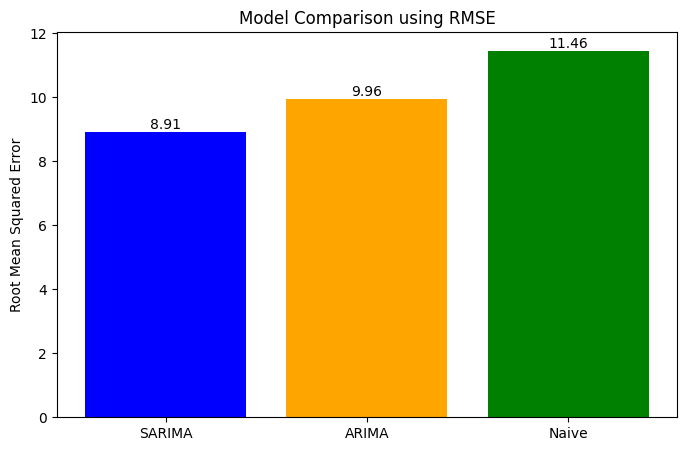

In [216]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

def evaluate_models(test_s, sarima_preds, arima_preds, naive_preds):
    """
    Evaluate and compare the performance of SARIMA, ARIMA, and Naive models on the given test set.

    Parameters:
    - test_s: DataFrame containing the true values.
    - sarima_preds: Series containing the SARIMA model predictions.
    - arima_preds: Series containing the ARIMA model predictions.
    - naive_preds: Series containing the Naive model predictions.

    Returns:
    - None (Prints MSE & MAE values and displays a plot comparing RMSE of the models).
    """

    # Compute RMSE (Root Mean Squared Error)
    sarima_rmse = mean_squared_error(test_s['accident_count'], sarima_preds, squared=False)
    arima_rmse = mean_squared_error(test_s['accident_count'], arima_preds, squared=False)
    naive_rmse = mean_squared_error(test_s['accident_count'], naive_preds, squared=False)

    # Compute MSE (Mean Squared Error)
    sarima_mse = mean_squared_error(test_s['accident_count'], sarima_preds, squared=True)
    arima_mse = mean_squared_error(test_s['accident_count'], arima_preds, squared=True)
    naive_mse = mean_squared_error(test_s['accident_count'], naive_preds, squared=True)

    # Compute MAE (Mean Absolute Error)
    sarima_mae = mean_absolute_error(test_s['accident_count'], sarima_preds)
    arima_mae = mean_absolute_error(test_s['accident_count'], arima_preds)
    naive_mae = mean_absolute_error(test_s['accident_count'], naive_preds)

    # Print results
    print("\nModel Performance Metrics:")
    print(f"{'Model':<10} {'MSE':>10} {'RMSE':>10} {'MAE':>10}")
    print("-" * 40)
    print(f"{'SARIMA':<10} {sarima_mse:>10.2f} {sarima_rmse:>10.2f} {sarima_mae:>10.2f}")
    print(f"{'ARIMA':<10} {arima_mse:>10.2f} {arima_rmse:>10.2f} {arima_mae:>10.2f}")
    print(f"{'Naive':<10} {naive_mse:>10.2f} {naive_rmse:>10.2f} {naive_mae:>10.2f}")

    # List of RMSE values for plotting
    rmse_values = [sarima_rmse, arima_rmse, naive_rmse]
    models = ['SARIMA', 'ARIMA', 'Naive']

    # Plot the RMSE comparison
    plt.figure(figsize=(8, 5))
    plt.bar(models, rmse_values, color=['blue', 'orange', 'green'])
    plt.ylabel('Root Mean Squared Error')
    plt.title('Model Comparison using RMSE')

    # Annotate the bars with RMSE values
    for i, value in enumerate(rmse_values):
        plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')

    plt.show()

# Example usage:
evaluate_models(test_s, test_s['sarima_pred1'], test_s['arima_pred1'], test_s['naive_pred1'])


## XGBOOST Model

Root Mean Squared Error (RMSE): 10.116617207593114
Mean Absolute Error (MAE): 7.9437501430511475


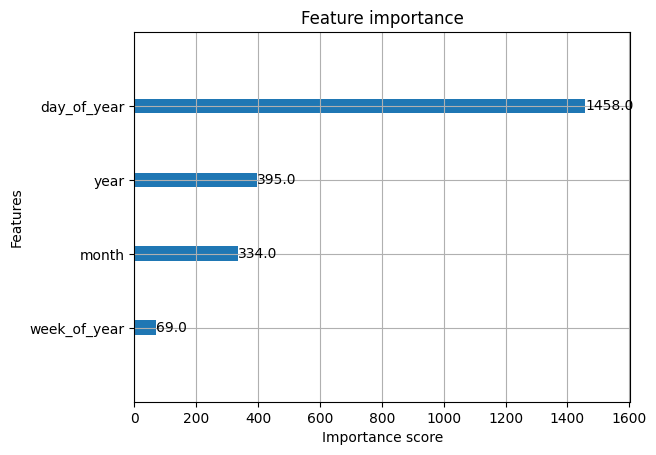

In [217]:
# Ensure the index of weekly_accidents is a DatetimeIndex
weekly_accidents_s.index = pd.to_datetime(weekly_accidents.index)

# Extract features from the index
X1 = weekly_accidents_s.drop(columns=['accident_count'])  # Features (all columns except 'accident_count')
y1 = weekly_accidents_s['accident_count']  # Target (accident count)

# Extract time-based features
X1['day_of_week'] = X1.index.dayofweek  # 0=Monday, 6=Sunday
X1['month'] = X1.index.month  # Extract the month
X1['year'] = X1.index.year  # Extract the year
X1['day_of_year'] = X1.index.dayofyear  # Extract the day of the year
X1['week_of_year'] = X1.index.isocalendar().week  # Extract the week number of the year

# Split the data into train and test sets (70% train, 30% test)
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.30, random_state=42)

# Convert the data into DMatrix format for XGBoost
import xgboost as xgb
dtrain = xgb.DMatrix(X_train1, label=y_train1)
dtest = xgb.DMatrix(X_test1, label=y_test1)

# Define hyperparameters for the XGBoost model
params = {
    'objective': 'reg:squarederror',  # For regression tasks
    'eval_metric': 'rmse',  # Metric to evaluate
    'max_depth': 6,  # Maximum depth of the tree
    'learning_rate': 0.1,  # Step size
    'n_estimators': 100  # Number of boosting rounds
}

# Train the XGBoost model
num_round = 100  # Number of boosting rounds
bst = xgb.train(params, dtrain, num_round)

# Make predictions on the test set
y_pred = bst.predict(dtest)

from sklearn.metrics import mean_squared_error, mean_absolute_error

# Evaluate the model using RMSE
rmse_xgboost = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE): {rmse_xgboost}')

# Evaluate the model using MAE
mae_xgboost = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE): {mae_xgboost}')

# Plot feature importance
import matplotlib.pyplot as plt
xgb.plot_importance(bst)
plt.show()


In [218]:
# examine predictor variables
X1

,day_of_week,month,year,day_of_year,week_of_year
date,,,,,
2017-01-01,6,1,2017,1,52
2017-01-08,6,1,2017,8,1
2017-01-15,6,1,2017,15,2
2017-01-22,6,1,2017,22,3
2017-01-29,6,1,2017,29,4
...,...,...,...,...,...
2019-12-01,6,12,2019,335,48
2019-12-08,6,12,2019,342,49
2019-12-15,6,12,2019,349,50


In [219]:
# examine atrget variable
y1

date
2017-01-01     4
2017-01-08    49
2017-01-15    80
2017-01-22    47
2017-01-29    72
              ..
2019-12-01    48
2019-12-08    68
2019-12-15    49
2019-12-22    61
2019-12-29    23
Name: accident_count, Length: 157, dtype: int64

- **The SARIMA Model has a lower MSE, MAE, and RMSE.**

### City of London Weekly Accident Time Series Forecast Modelling using Sarima, Arima and Naive (baseline model)

In [220]:
# Execute the SQL query and get the result
results = cur.execute('''
SELECT date, police_force, accident_index 
FROM accident
WHERE police_force IN (48)
AND accident_year BETWEEN 2017 AND 2019;
''')

# Fetch all the results from the query
results = cur.fetchall()

# Create a DataFrame from the results
df_london = pd.DataFrame(results, columns=['date', 'police_force', 'accident_index'])

# Convert the 'date' column to datetime format
df_london['date'] = pd.to_datetime(df_london['date'], dayfirst=True)

# Display the first few rows of the DataFrame
df_london


,date,police_force,accident_index
0,2017-01-26,48,201701X017232
1,2017-01-12,48,201701X019554
2,2017-02-21,48,201701X020053
3,2017-03-06,48,201701X023279
4,2017-04-25,48,201701X033924
...,...,...,...
863,2019-10-17,48,2019480951145
864,2019-10-24,48,2019480951151
865,2019-12-06,48,2019480951155
866,2019-12-12,48,2019480951177


In [221]:
## Set 'date' as index
df_london.set_index('date', inplace=True)
 
# Aggregate weekly accident counts
weekly_accidents_l = df_london.groupby(['police_force']).resample('W').size().unstack(level=0)
 
weekly_accidents_l = df_london.resample('W').size().reset_index(name='accident_count')
 
# Set 'date' as index
weekly_accidents_l.set_index('date', inplace=True)
 
# remove last row which represnets first week in 2020
weekly_accidents_l = weekly_accidents_l[:-1]

# Display DataFrame
weekly_accidents_l

,accident_count
date,
2017-01-01,1
2017-01-08,2
2017-01-15,9
2017-01-22,1
2017-01-29,6
...,...
2019-12-01,7
2019-12-08,6
2019-12-15,4


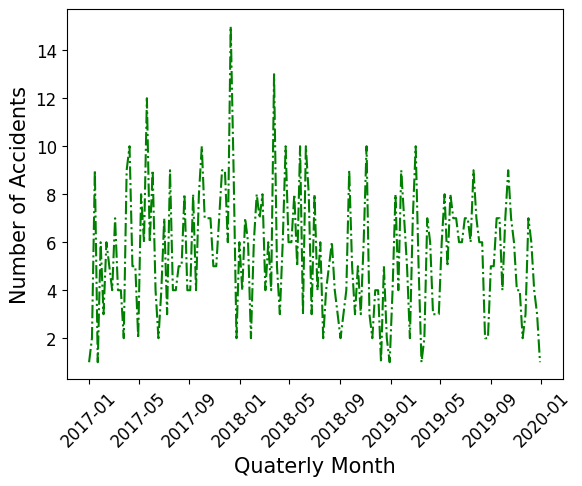

In [222]:
# Visualisation of the data
plt.plot(weekly_accidents_l.index, weekly_accidents_l['accident_count'], 'g-.')

# Adding labels and title
plt.xlabel('Quaterly Month', fontsize=15)
plt.ylabel('Number of Accidents', fontsize=15)

# Formatting the ticks on x and y axis
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Display the plot
plt.show()

### Decompose the Series 

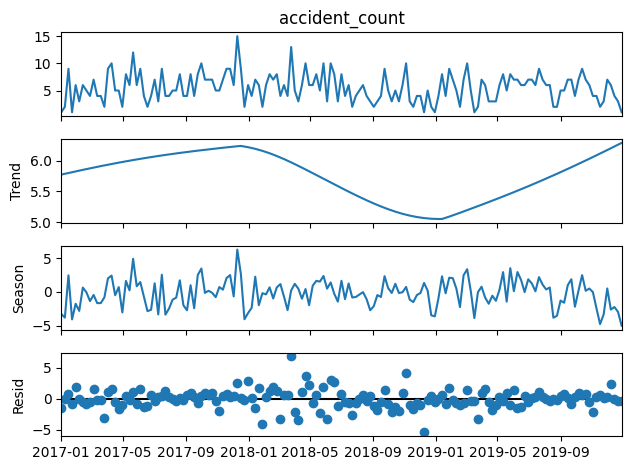

In [223]:
# Decomposition of the series 
from statsmodels.tsa.seasonal import STL  

STL(weekly_accidents_l['accident_count']).fit().plot()
plt.show()

#### Investigate time series data to check for stationarity
- Using Augmented-Dickey Fuller test
- Augmented Dickey-Fuller (ADF) Test (p-value most be less than 0.05) to reject null hypothesis of non-stationarity else we perform differencing

In [224]:
# Stationarity test using Augmented Dickey-Fuller
from statsmodels.tsa.stattools import adfuller
ADF_test = adfuller(weekly_accidents_l['accident_count'])

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -10.917238159211982; p-value 1.0599010782100905e-19


Given the ADF Statistic: ADF Statistic: -10.917238159211982; p-value 1.0599010782100905e-19, we can reject the null hypothesis and conclude that the time series is stationary. There is strong evidence that the data does not have a unit root and does not require further differencing to achieve stationarity.

### To further understand the series, plot correlation and autocorrelation

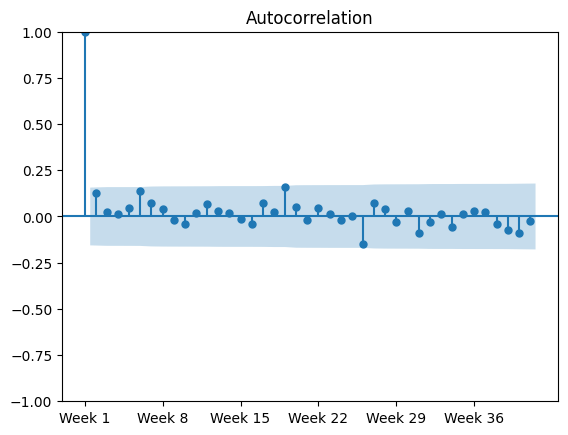

In [225]:
# Plot ACF
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(weekly_accidents_l['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

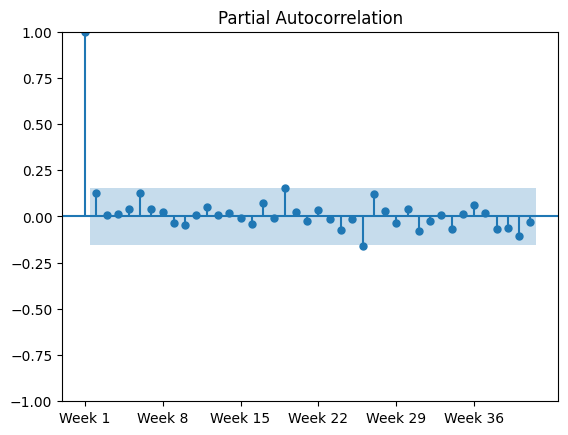

In [226]:
# Plot PACF
plot_pacf(weekly_accidents_l['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 7)  # Set ticks at intervals of 7
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

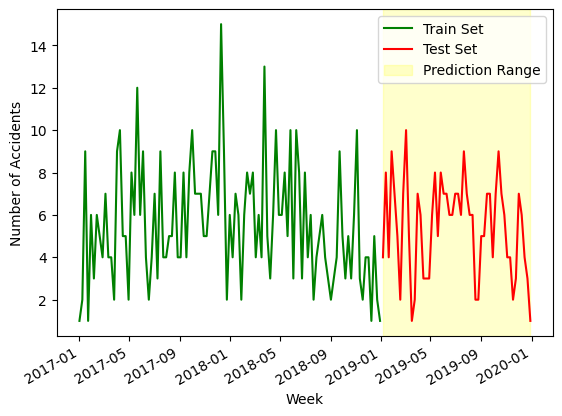

In [227]:
# Splitting the dataset into train and test sets
train_l = weekly_accidents_l[['accident_count']][:len(weekly_accidents) - 52]  # All weeks before the last 7 weeks
test_l = weekly_accidents_l[['accident_count']][-52:]  # Last 7 weeks for prediction

# Creating the plot
fig, ax = plt.subplots()

# Plotting the train and test sets
ax.plot(train_l.index, train_l['accident_count'], 'g-', label='Train Set')  # Train set in green
ax.plot(test_l.index, test_l['accident_count'], 'r-', label='Test Set')  # Test set in red

# Labeling the axes
ax.set_xlabel('Week')
ax.set_ylabel('Number of Accidents')

# Highlighting the range (example, adjust to your specific needs)
ax.axvspan(test_s.index[0], test_s.index[-1], alpha=0.2, color='yellow', label='Prediction Range')

# Formatting the x-axis labels to make them more readable
fig.autofmt_xdate()

# Adding legend
plt.legend()

# Show the plot
plt.show()

### Building and Evaluating the Model
The Akaike information criterion (AIC) is a mathematical method for evaluating how well a model fits the data it was generated from. In statistics, AIC is used to compare different possible models (p,q values) and determine which one is the best fit for the data

In [228]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,10,1) # Order of AR
qs = np.arange(0,10,1) # Order of MA
Ps = [0] # Seasonal order of AR 
Qs = [0] # Seasonal order of MA 
d=0 # zero-order differencing
D = 0 # Seasonal differencing 
s= 52 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

In [229]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress barfrom tqdm import tqdm # to show progress bar

# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=train_l, order=(order[1], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train_s)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.74it/s]


In [230]:
# examine aic values
aic_df

,"Order(p,q,Ps,QS)",AIC
81,"(8, 1, 0, 0)",517.486016
71,"(7, 1, 0, 0)",517.486016
61,"(6, 1, 0, 0)",517.486016
51,"(5, 1, 0, 0)",517.486016
41,"(4, 1, 0, 0)",517.486016
...,...,...
60,"(6, 0, 0, 0)",683.672157
20,"(2, 0, 0, 0)",683.672157
10,"(1, 0, 0, 0)",683.672157
70,"(7, 0, 0, 0)",683.672157


Based on the lowest AIC value, p=1 and q=1.

In [231]:
# import SARIMAX Model
from statsmodels.tsa.statespace.sarimax import SARIMAX

# fitting the SARIMA model based on the lowest AIC, order(p,d,q)
sarima_model2 = SARIMAX(endog=train_l, order=(8,0,1), seasonal_order=(0,0,0,52)).fit()  # Close the parentheses properly
print(sarima_model2.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  105
Model:               SARIMAX(8, 0, 1)   Log Likelihood                -254.478
Date:                Fri, 04 Apr 2025   AIC                            528.956
Time:                        17:07:23   BIC                            555.495
Sample:                    01-01-2017   HQIC                           539.710
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9225      0.242      3.815      0.000       0.449       1.396
ar.L2          0.0419      0.140      0.299      0.765      -0.233       0.317
ar.L3          0.0034      0.151      0.022      0.9

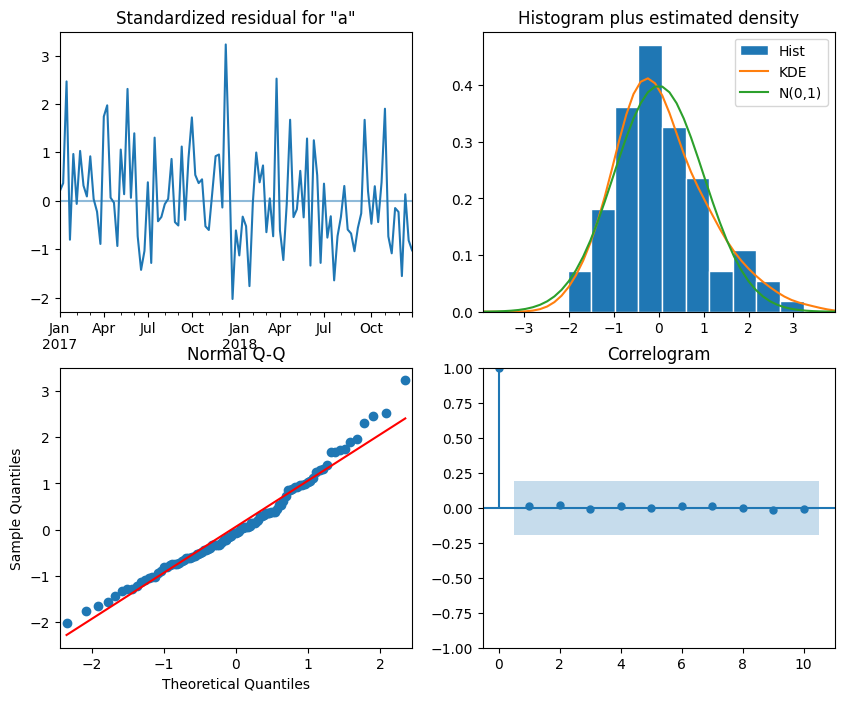

In [232]:
# plot of the Q-Q plot
sarima_model2.plot_diagnostics(figsize=(10,8));

In [233]:
# Perform Ljung-Box test on the residuals
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(sarima_model2.resid) #returns test score for first 10 lags.

,lb_stat,lb_pvalue
1,0.006678,0.934871
2,0.103487,0.949572
3,0.109834,0.990632
4,0.139633,0.997673
5,0.140859,0.999623
6,0.168324,0.999907
7,0.187281,0.999980
8,0.187583,0.999997
9,0.202808,0.999999
10,0.217074,1.000000


In [234]:
# Forecasting the test set using both naive_model(using the last values) and arima
len_test_l = len(test_l)

sarima_pred2 = sarima_model2.get_forecast(len_test_l).predicted_mean.values
naive_pred2 = train_l['accident_count'][len(train_l)-52:len(train_l)].values
           
test_l['naive_pred2'] = naive_pred2
test_l['sarima_pred2'] = sarima_pred2

# examine test df
test_l

,accident_count,naive_pred2,sarima_pred2
date,,,
2019-01-06,4,4,3.637351
2019-01-13,8,7,3.240325
2019-01-20,4,6,3.564473
2019-01-27,9,2,3.195242
2019-02-03,7,6,3.146237
2019-02-10,5,8,3.150224
2019-02-17,2,7,3.167845
2019-02-24,7,8,3.379739
2019-03-03,10,4,3.306864


### ARIMA Model

In [235]:
# import ARIMA Model
from statsmodels.tsa.arima.model import ARIMA

In [236]:
arima_model2 = ARIMA(train_l, order=(8, 0, 1))  # p=8, d=1, q=1
model_fit = arima_model2.fit()

# Summary of the model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:         accident_count   No. Observations:                  105
Model:                 ARIMA(8, 0, 1)   Log Likelihood                -252.321
Date:                Fri, 04 Apr 2025   AIC                            526.642
Time:                        17:07:23   BIC                            555.836
Sample:                    01-01-2017   HQIC                           538.472
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.3369      0.613      8.713      0.000       4.136       6.537
ar.L1          0.0060     23.645      0.000      1.000     -46.337      46.349
ar.L2          0.0550      0.455      0.121      0.9

In [237]:
# Access the residuals for Arima Model
residuals = model_fit.resid

# Apply Ljung-Box test
ljungbox_result = acorr_ljungbox(residuals, lags=[10], return_df=True)

print(ljungbox_result)

     lb_stat  lb_pvalue
10  0.063335        1.0


In [238]:
# Forecasting for the next 'len_test' periods - 52 weeks
len_test_l = len(test_l)
arima_pred2 = model_fit.forecast(steps=len_test_l)
test_l['arima_pred2'] = arima_pred2

### Evaluate Sarima, Arima, Naive and XGBOOST Models using Mean Square Error and Mean Absolute Error

SARIMA MSE: 3.17
SARIMA MAE: 2.68
ARIMA MSE: 2.31
ARIMA MAE: 1.94
Naive MSE: 3.40
Naive MAE: 2.54


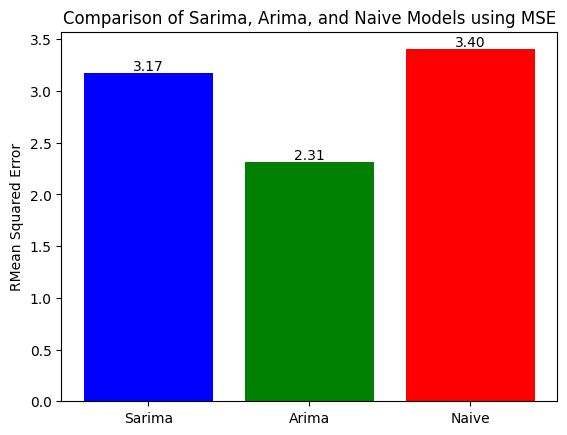

In [239]:
# Import RMSE and MAE
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

def evaluate_models(test_data, sarima_pred, arima_pred, naive_pred):
    """
    Evaluates and compares the performance of SARIMA, ARIMA, and Naive models using RMSE (Root Mean Squared Error) and Mean Square Error.
    
    Parameters:
    - test_l: A DataFrame containing the true values of the test set for the City of London.
    - sarima_pred2: Predictions from the SARIMA model.
    - arima_pred2: Predictions from the ARIMA model.
    - naive_pred2: Predictions from the Naive model.
    """
    # Evaluate SARIMA Model
    sarima_mse2 = mean_squared_error(test_l['accident_count'], sarima_pred2, squared=False)
    sarima_mae2 = mean_absolute_error(test_l['accident_count'], sarima_pred2)
    
    # Evaluate ARIMA Model
    arima_mse2 = mean_squared_error(test_l['accident_count'], arima_pred2, squared=False)
    arima_mae2 = mean_absolute_error(test_l['accident_count'], arima_pred2)
    
    # Evaluate Naive Model
    naive_mse2 = mean_squared_error(test_l['accident_count'], naive_pred2, squared=False)
    naive_mae2 = mean_absolute_error(test_l['accident_count'], naive_pred2)
    
    # Print RMSE values
    print(f"SARIMA MSE: {sarima_mse2:.2f}")
    print(f"SARIMA MAE: {sarima_mae2:.2f}")
    print(f"ARIMA MSE: {arima_mse2:.2f}")
    print(f"ARIMA MAE: {arima_mae2:.2f}")
    print(f"Naive MSE: {naive_mse2:.2f}")
    print(f"Naive MAE: {naive_mae2:.2f}")
    
    # Plotting the results
    list_mse = [sarima_mse2, arima_mse2, naive_mse2]
    models = ['Sarima', 'Arima', 'Naive']
    
    plt.bar(x=models, height=list_mse, color=['blue', 'green', 'red'])
    plt.ylabel('RMean Squared Error')
    plt.title('Comparison of Sarima, Arima, and Naive Models using MSE')

    # Annotate the bars with the RMSE values
    for i, value in enumerate(list_mse):
        plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')
    
    # Show the plot
    plt.show()

# function usage:
evaluate_models(test_l, test_l['sarima_pred2'], test_l['arima_pred2'], test_l['naive_pred2'])


## xgboost Model

Root Mean Squared Error (RMSE): 3.074325106642384
Mean Squared Error (MSE): 9.451474861331704
Mean Absolute Error (MAE): 2.474672426780065


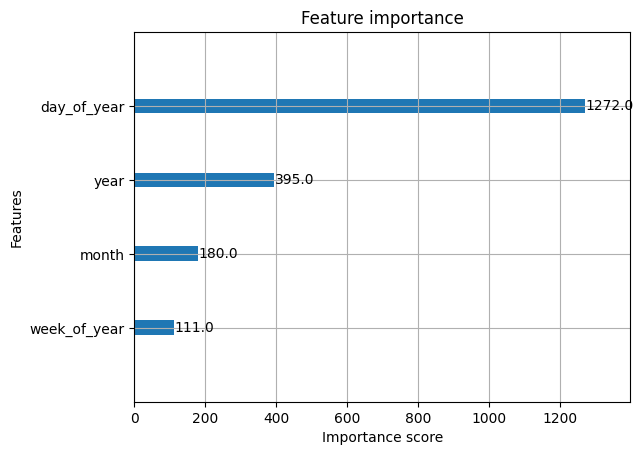

In [240]:
# Prepare the features (X) and target (y)
X2 = weekly_accidents_l.drop(columns=['accident_count'])  # Features (all columns except 'accident_count')
y2 = weekly_accidents_l['accident_count']  # Target (accident count)

# Extract time-based features
X2['day_of_week'] = X2.index.dayofweek
X2['month'] = X2.index.month
X2['year'] = X2.index.year
X2['day_of_year'] = X2.index.dayofyear
X2['week_of_year'] = X1.index.isocalendar().week  # Extract the week number of the year

# Split the data into train and test sets (70% train, 30% test)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.30, random_state=42)

# Convert the data into DMatrix format for XGBoost
dtrain2 = xgb.DMatrix(X_train2, label=y_train2)
dtest2 = xgb.DMatrix(X_test2, label=y_test2)

# Define hyperparameters for the XGBoost model
params = {
    'objective': 'reg:squarederror',  # For regression tasks
    'eval_metric': 'rmse',  # Metric to evaluate
    'max_depth': 6,  # Maximum depth of the tree
    'learning_rate': 0.1,  # Step size
    'n_estimators': 100  # Number of boosting rounds
}

# Train the XGBoost model
num_round = 100  # Number of boosting rounds
bst2 = xgb.train(params, dtrain2, num_round)

# Make predictions on the test set
y_pred_xgboost = bst2.predict(dtest2)

from sklearn.metrics import mean_squared_error, mean_absolute_error

# Evaluate the model using RMSE
rmse_xgboost = np.sqrt(mean_squared_error(y_test2, y_pred_xgboost))
print(f'Root Mean Squared Error (RMSE): {rmse_xgboost}')

mse_xgboost = mean_squared_error(y_test2, y_pred_xgboost)
print(f'Mean Squared Error (MSE): {mse_xgboost}')


# Evaluate the model using MAE
mae_xgboost = mean_absolute_error(y_test2, y_pred_xgboost )
print(f'Mean Absolute Error (MAE): {mae_xgboost}')

# Plot feature importance
xgb.plot_importance(bst2)
plt.show()


In [241]:
# examine predictor variables
X2

,day_of_week,month,year,day_of_year,week_of_year
date,,,,,
2017-01-01,6,1,2017,1,52
2017-01-08,6,1,2017,8,1
2017-01-15,6,1,2017,15,2
2017-01-22,6,1,2017,22,3
2017-01-29,6,1,2017,29,4
...,...,...,...,...,...
2019-12-01,6,12,2019,335,48
2019-12-08,6,12,2019,342,49
2019-12-15,6,12,2019,349,50


In [242]:
# examine the target variable
y2

date
2017-01-01    1
2017-01-08    2
2017-01-15    9
2017-01-22    1
2017-01-29    6
             ..
2019-12-01    7
2019-12-08    6
2019-12-15    4
2019-12-22    3
2019-12-29    1
Name: accident_count, Length: 157, dtype: int64

- **The ARIMA model has a lower MSE and MAE**

## Question 7: Identify the three Local Super Output Areas (LSOAs) of Hull city that recorded the highest number of road accidents in the first three months of 2020, then employ a time series model to forecast daily accident occurrences for the upcoming month (e.g., July), leveraging data from the preceding six months (e.g., January to June) for these high-incident areas.

### Extract the three LSOAs with the highest accident counts.

In [243]:
# SQL Query to extract top three lsoas in kingston upon hull
results = cur.execute(''' SELECT accident.lsoa_of_accident_location, COUNT(*) AS accident_count
FROM accident
INNER JOIN lsoa ON accident.lsoa_of_accident_location = lsoa.lsoa01cd
WHERE lsoa.lsoa01nm LIKE '%Kingston Upon Hull%' 
AND strftime('%Y-%m-%d', SUBSTR(date, 7, 4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1, 2)) 
    BETWEEN '2020-01-01' AND '2020-03-31'
GROUP BY accident.lsoa_of_accident_location
ORDER BY accident_count DESC
LIMIT 3;
''')

results = cur.fetchall()

#convert to dataframe
lsoa_top_df = pd.DataFrame(results, columns=('LSOA', 'accident_count'))

# examine dataframe
lsoa_top_df

,LSOA,accident_count
0,E01012817,10
1,E01012889,7
2,E01012848,7


### Extract first 6 months of 2020  data using LSOA regions with top accidents
- The goal is to understand accident risks at the local level i.e. Forecast each LSOA separately
- Starting with the LSOA01CD - E01012817

In [244]:
results = cur.execute('''SELECT accident.date, COUNT(*) AS daily_accidents
FROM accident
INNER JOIN lsoa ON accident.lsoa_of_accident_location = lsoa.lsoa01cd
WHERE lsoa.lsoa01nm LIKE '%Kingston Upon Hull%' 
AND lsoa01cd = 'E01012817'  -- specify the LSOA code for the region of interest
AND strftime('%Y-%m-%d', SUBSTR(date, 7, 4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1, 2)) 
    BETWEEN '2020-01-01' AND '2020-06-31'  -- Ensure the date is between January and July 2020
GROUP BY accident.date, lsoa01cd
ORDER BY accident.date;
''')

# Fetch the results from the SQL query
results = cur.fetchall()

# Convert the results into a DataFrame for further analysis
import pandas as pd
lsoa_daily_df = pd.DataFrame(results, columns=('date', 'accident_count'))

# Examine the first few rows of the DataFrame to check the results
print(lsoa_daily_df.head())


         date  accident_count
0  01/05/2020               1
1  02/01/2020               2
2  03/01/2020               1
3  03/02/2020               1
4  09/06/2020               1


In [245]:
# Convert 'date' to datetime format
lsoa_daily_df['date'] = pd.to_datetime(lsoa_daily_df['date'], dayfirst=True)

# Now perform the resampling
daily_accidents1 = lsoa_daily_df.set_index('date').resample('D').sum()

# examine daily accidents by LSOA 
daily_accidents1

,accident_count
date,
2020-01-02,2
2020-01-03,1
2020-01-04,0
2020-01-05,0
2020-01-06,0
...,...
2020-06-09,1
2020-06-10,0
2020-06-11,0


#### Decompose Daily Time Series

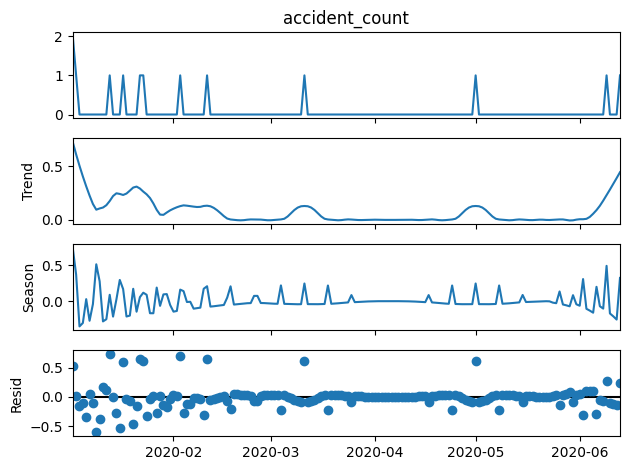

In [246]:
# Decomposition of the series 
from statsmodels.tsa.seasonal import STL  

STL(daily_accidents1['accident_count']).fit().plot()
plt.show()

### ADF Test to examine non-stationarity
- Dickey, D.A. and Fuller, W.A., 1979. Distribution of the estimators for autoregressive time series with a unit root. Journal of the American statistical association, 74(366a), pp.427-431.

In [247]:
#Is the data stationary?
# Testing the differenced series for stationarity
ADF_test = adfuller(daily_accidents1['accident_count'])

print(f"ADF Statistic: {ADF_test[0]}; p-value {ADF_test[1]}")

ADF Statistic: -12.171332777577229; p-value 1.4185363256511773e-22


ADF Value is below .05 confidence level, hence we do not need to difference.

### Plot ACF and PACF to understand Autoregressive and moving average values

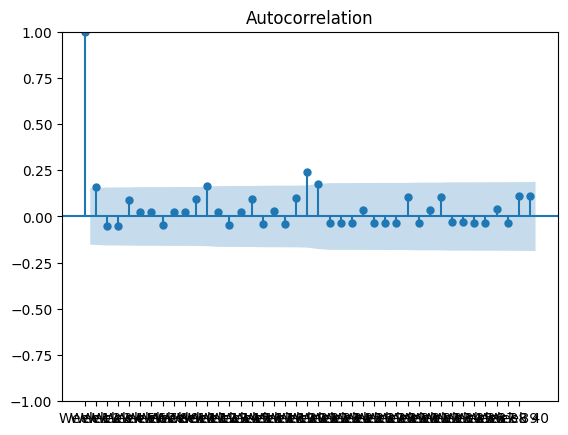

In [248]:
# Plot of ACF to understand the series 
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf


from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(daily_accidents1['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 1)  # Set ticks at intervals of 1 for daily
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks

# Show the plot
plt.show()

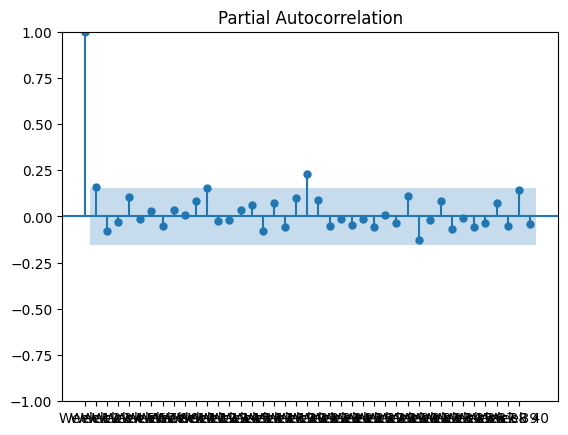

In [249]:
# Plot PACF
plot_pacf(daily_accidents1['accident_count'], lags=40)

# Adjust the x-axis to show weekly intervals
ticks = np.arange(0, 40, 1)  # Set ticks at intervals of 1 for daily
plt.xticks(ticks, labels=[f"Week {i+1}" for i in ticks])  # Adjust labels to represent weeks


# Show the plot
plt.show()

##~ SARIMA Model to forecast daily accident prediction for the first six months of 2020

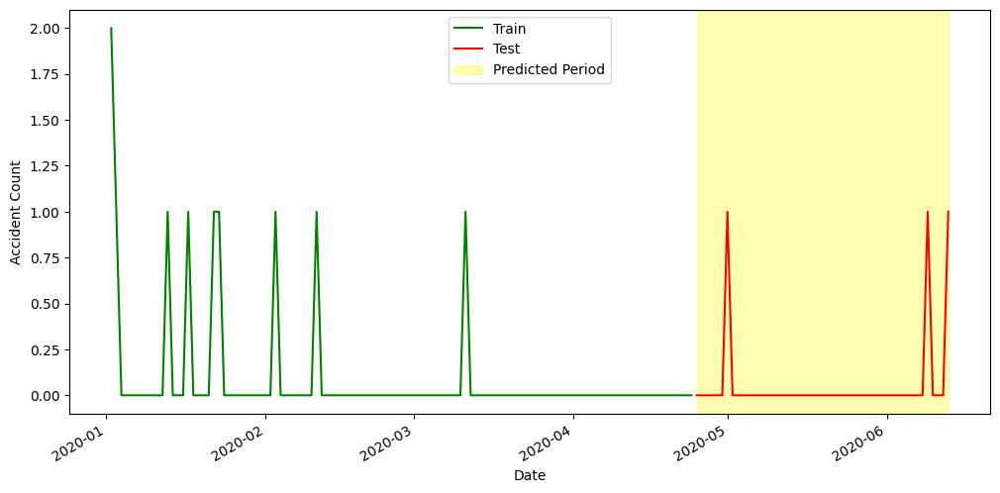

In [250]:
# Split data into train and test
size = int(len(daily_accidents1) * 0.70)
X_train, X_test = daily_accidents1[0:size], daily_accidents1[size:len(daily_accidents1)]

# Plotting the train and test sets
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the training data in green and the test data in red
ax.plot(X_train.index, X_train[['accident_count']], 'g-', label='Train')
ax.plot(X_test.index, X_test[['accident_count']], 'r-', label='Test')

# Labeling the axes
ax.set_xlabel('Date')
ax.set_ylabel('Accident Count')

# Shade the predicted period with yellow
ax.axvspan(X_test.index[0], X_test.index[-1], alpha=0.3, color='yellow', label='Predicted Period')

# Automatically format the x-axis to handle date labels
fig.autofmt_xdate()

# Add legend to the plot
plt.legend()

# Show the plot
plt.show()



### Build SARIMA Model using Akaike Information Criterion (AIC) 
– AIC is used to select the best combination of Autoregressive AND Moving Average Process (ARMA). The best is the one with the lowest  score.

In [251]:
# Split data into train and test
size = int(len(daily_accidents1) * 0.70)
X_train, X_test = daily_accidents1[0:size], daily_accidents1[size:len(daily_accidents1)]


In [252]:
# Specifying a range of parameters to determine the order using AIC
from itertools import product
ps = np.arange(0,10,1) # Order of AR
qs = np.arange(0,10,1) # Order of MA
Ps = [0] # Seasonal order of AR 
Qs = [0] # Seasonal order of MA 
d=0 # zero-order differencing
D = 0 # Seasonal differencing 
s= 365 # period
p_q_list = list(product(ps,qs,Ps,Qs))
p_q_list[:5]

[(0, 0, 0, 0), (0, 1, 0, 0), (0, 2, 0, 0), (0, 3, 0, 0), (0, 4, 0, 0)]

In [253]:
import warnings
warnings.filterwarnings("ignore") #ignoring the warnings
from tqdm import tqdm # to show progress barfrom tqdm import tqdm # to show progress bar

# Function to plot the aic
def aic_values(target):
    
    """This functions accepts a series and returns the aic values"""
    list_of_aic = []

    for order in tqdm(p_q_list):
        try:
            model = SARIMAX(endog=X_train, order=(order[0], d, order[1]),
            seasonal_order=(order[2], D, order[3], s), simple_differencing=False).fit(disp=False)  #fitting the model for all values of p and q
        except:
            continue #skipping where model fails to fit. Just to showcase error handling, not recommended. Try to find the specific errors and then resolve the issue. 

        list_of_aic.append([order, model.aic]) #model.aic returns the AIC value for the specific model. The list_of_aic is storing all the AIC values for their models (represented by orders)
        
    aic_df = pd.DataFrame(list_of_aic, columns = ['Order(p,q,Ps,QS)','AIC']) #converting list to a dataframe
    aic_df.sort_values(by='AIC', ascending=True, inplace=True)#.reset_index(drop=True) #sorting the AIC values in incremental order, because we want the model with lowest AIC value.
    return aic_df

aic_df = aic_values(train_s)     # only find the AIC values on train data. If test data used, the problem of data leakage occurs.

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.93it/s]


In [254]:
aic_df

,"Order(p,q,Ps,QS)",AIC
12,"(1, 2, 0, 0)",58.165948
89,"(8, 9, 0, 0)",58.278852
34,"(3, 4, 0, 0)",58.680667
79,"(7, 9, 0, 0)",58.692668
69,"(6, 9, 0, 0)",59.087184
...,...,...
71,"(7, 1, 0, 0)",70.453829
88,"(8, 8, 0, 0)",70.476438
9,"(0, 9, 0, 0)",70.826981
90,"(9, 0, 0, 0)",71.491176


The lowest AIC values is 58.165948 with AR(p)= 1 and MA(q)=2, d=0 since no differencing took place

In [255]:
model_d1 = SARIMAX(X_train['accident_count'],  
                order = (1, 0, 2),  
                seasonal_order =(0, 0, 0, 365)) 
  
result = model_d1.fit() 
result.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         accident_count   No. Observations:                  114
Model:               SARIMAX(1, 0, 2)   Log Likelihood                 -25.083
Date:                Fri, 04 Apr 2025   AIC                             58.166
Time:                        17:07:51   BIC                             69.111
Sample:                    01-02-2020   HQIC                            62.608
                         - 04-24-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9930      0.017     58.157      0.000       0.960       1.026
ma.L1         -0.6799      0.096     -7.105      0.000      -0.867      -0.492
ma.L2         -0.2553      0.079     -3.213      0.001      -0.411      -0.100
sigma2         0.0901      0.011      8.104      0.000       0.068       0.112
===================================================================================
Ljung-Box (L1) (Q):                   1.21   Jarque-Bera (JB):               905.27
Prob(Q):                              0.27   Prob(JB):                         0.00
Heteroskedasticity (H):               0.00   Skew:                             3.11
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.32
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

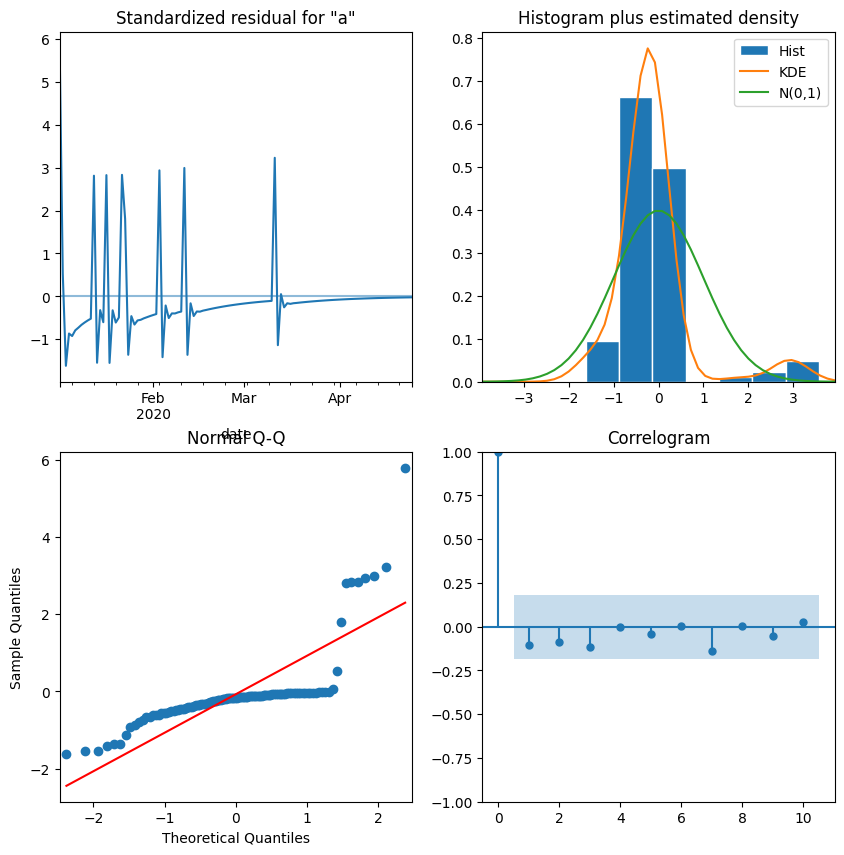

In [256]:
# Q-Q plot
result.plot_diagnostics(figsize = (10,10))
plt.show()

In [257]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(result.resid)

,lb_stat,lb_pvalue
1,0.873834,0.349896
2,1.921108,0.382681
3,3.433218,0.329527
4,3.439244,0.487176
5,3.655897,0.599941
6,3.655947,0.723119
7,5.765176,0.567421
8,5.765187,0.673515
9,6.138165,0.726014
10,6.215374,0.796855


## Test the model

In [258]:
y_pred1 = result.forecast(steps=31) 
y_pred1

2020-04-25    0.006244
2020-04-26    0.007881
2020-04-27    0.007826
2020-04-28    0.007771
2020-04-29    0.007716
2020-04-30    0.007662
2020-05-01    0.007609
2020-05-02    0.007555
2020-05-03    0.007502
2020-05-04    0.007450
2020-05-05    0.007397
2020-05-06    0.007346
2020-05-07    0.007294
2020-05-08    0.007243
2020-05-09    0.007192
2020-05-10    0.007142
2020-05-11    0.007092
2020-05-12    0.007042
2020-05-13    0.006993
2020-05-14    0.006944
2020-05-15    0.006895
2020-05-16    0.006847
2020-05-17    0.006799
2020-05-18    0.006751
2020-05-19    0.006704
2020-05-20    0.006657
2020-05-21    0.006610
2020-05-22    0.006564
2020-05-23    0.006518
2020-05-24    0.006472
2020-05-25    0.006427
Freq: D, Name: predicted_mean, dtype: float64

### Forecast for the second LSOA region - E01012889

In [259]:
results = cur.execute('''SELECT accident.date, COUNT(*) AS daily_accidents
FROM accident
INNER JOIN lsoa ON accident.lsoa_of_accident_location = lsoa.lsoa01cd
WHERE lsoa.lsoa01nm LIKE '%Kingston Upon Hull%' 
AND lsoa01cd = 'E01012889'  -- specify the LSOA code for the region of interest
AND strftime('%Y-%m-%d', SUBSTR(date, 7, 4) || '-' || SUBSTR(date, 4, 2) || '-' || SUBSTR(date, 1, 2)) 
    BETWEEN '2020-01-01' AND '2020-06-31'  -- Ensure the date is between January and July 2020
GROUP BY accident.date, lsoa01cd
ORDER BY accident.date;
''')

# Fetch the results from the SQL query
results = cur.fetchall()

# Convert the results into a DataFrame for further analysis
import pandas as pd
lsoa_daily_df2 = pd.DataFrame(results, columns=('date', 'accident_count'))

# Examine the first few rows of the DataFrame to check the results
print(lsoa_daily_df2.head())


         date  accident_count
0  10/01/2020               1
1  11/02/2020               1
2  13/03/2020               1
3  15/04/2020               1
4  16/02/2020               1


In [ ]:
# Convert 'date' to datetime format
lsoa_daily_df2['date'] = pd.to_datetime(lsoa_daily_df2['date'], dayfirst=True)

# Now perform the resampling
daily_accidents2 = lsoa_daily_df2.set_index('date').resample('D').sum()

# examine daily accidents by LSOA 
daily_accidents2

## Question 8: Construct a social network using the provided data and visualise the network, then provide the basic network characteristics, including numbers of nodes and edges, network density, average degree.

Graph: an abstract mathematical representation of relationships among nodes.
- ❑ Network: Physical representation of a graph.
- ❑ Degree of a node: This is the number of connections (edges) a node has.
- ❑ Distance: The shortest path between two nodes.
- ❑ In-degree of A: Number of edges coming into node A;
- ❑ Out-degree of A: Number of edges going out of node A;
- ❑ Density: Number of ties (connections) expressed as the percentage of directed (egdes)
over the total number of undirected pairs (possible edges) between all pairs of nodes
in a network.
- ❑ Cluster: unique groups or communities in a network.
- ❑ Symmetric relation: This occurs if X is connected to Y and Y is also connected to X.


In [260]:
# import .txt file
FielName="facebook_combined.txt"
Graphtype=net.Graph()   # use net.Graph() for undirected graph # facebook is an undirected graph
#Graphtype=net.Graph() # undirected graph

# How to read from a file. Note: if your egde weights are int, 
# change float to int.
G = net.read_edgelist(
    FielName, 
    create_using=Graphtype,
    nodetype=int,
    data=(('weight',float),)
)


### Visualize the network

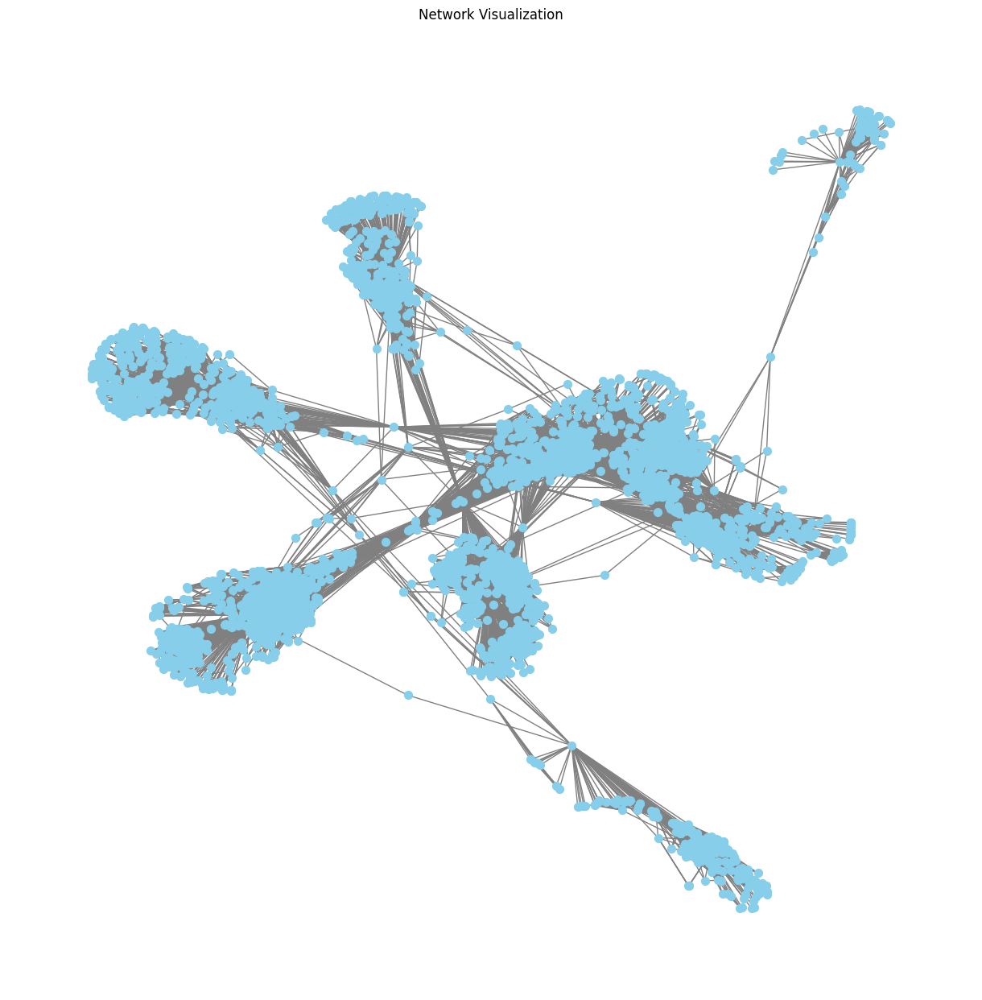

In [261]:
# Set up the plot
plt.figure(figsize=(12, 12))

# Draw the graph
nx.draw(G, node_size=50, node_color="skyblue", font_size=10, font_weight="bold", edge_color="gray")

# Display the plot
plt.title("Network Visualization")
plt.show()


In [262]:
# Initialize an empty dictionary to store the degree of each node
node_degrees = {}

# Loop through each node in the graph and calculate its degree
for node in G.nodes():
    node_degrees[node] = G.degree(node)

# Print the degree of each node
for node, degree in node_degrees.items():
    print(f"Node {node}: Degree {degree}")

Node 0: Degree 347
Node 1: Degree 17
Node 2: Degree 10
Node 3: Degree 17
Node 4: Degree 10
Node 5: Degree 13
Node 6: Degree 6
Node 7: Degree 20
Node 8: Degree 8
Node 9: Degree 57
Node 10: Degree 10
Node 11: Degree 1
Node 12: Degree 1
Node 13: Degree 31
Node 14: Degree 15
Node 15: Degree 1
Node 16: Degree 9
Node 17: Degree 13
Node 18: Degree 1
Node 19: Degree 16
Node 20: Degree 15
Node 21: Degree 65
Node 22: Degree 11
Node 23: Degree 17
Node 24: Degree 16
Node 25: Degree 69
Node 26: Degree 68
Node 27: Degree 5
Node 28: Degree 13
Node 29: Degree 13
Node 30: Degree 17
Node 31: Degree 23
Node 32: Degree 6
Node 33: Degree 2
Node 34: Degree 5
Node 35: Degree 2
Node 36: Degree 11
Node 37: Degree 1
Node 38: Degree 9
Node 39: Degree 15
Node 40: Degree 44
Node 41: Degree 24
Node 42: Degree 2
Node 43: Degree 1
Node 44: Degree 6
Node 45: Degree 12
Node 46: Degree 5
Node 47: Degree 2
Node 48: Degree 22
Node 49: Degree 4
Node 50: Degree 11
Node 51: Degree 7
Node 52: Degree 2
Node 53: Degree 31
Node 

In [263]:
# Calculate basic network statistics
num_nodes = G.number_of_nodes() # number of nodes
num_edges = G.number_of_edges() # number of edges
density = nx.density(G) # network density
# Calculate the average degree
degrees = [deg for node, deg in G.degree()]  # Get degree for each node
avg_degree = sum(degrees) / num_nodes if num_nodes > 0 else 0  # Calculate average degree


print("Basic Network Statistics:")
print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Network Density: {density}")
print(f"Average Degree: {avg_degree}")

Basic Network Statistics:
Number of Nodes: 4039
Number of Edges: 88234
Network Density: 0.010819963503439287
Average Degree: 43.69101262688784


### Question 9: Calculate the edge centrality of this network and plot the distribution of the edge centrality values.



- Connectivity: Edges with high centrality values are crucial for maintaining the overall connectivity of the network. If such edges are removed, the graph may become fragmented or disconnected.

- Flow of Information: In many real-world networks, such as communication, transportation, or social networks, the flow of information, resources, or influence often depends on certain edges. High centrality edges are important for ensuring that this flow happens efficiently.

- Vulnerability: Identifying edges with high centrality helps in understanding which edges, if removed or weakened, could cause significant disruption in the network's operation.

#### **Degree centrality** is calculated below:

Nodes with the highest Degree Centrality:
107: 0.258791480931154
1684: 0.1961367013372957
1912: 0.18697374938088163
3437: 0.13546310054482416
0: 0.08593363051015354


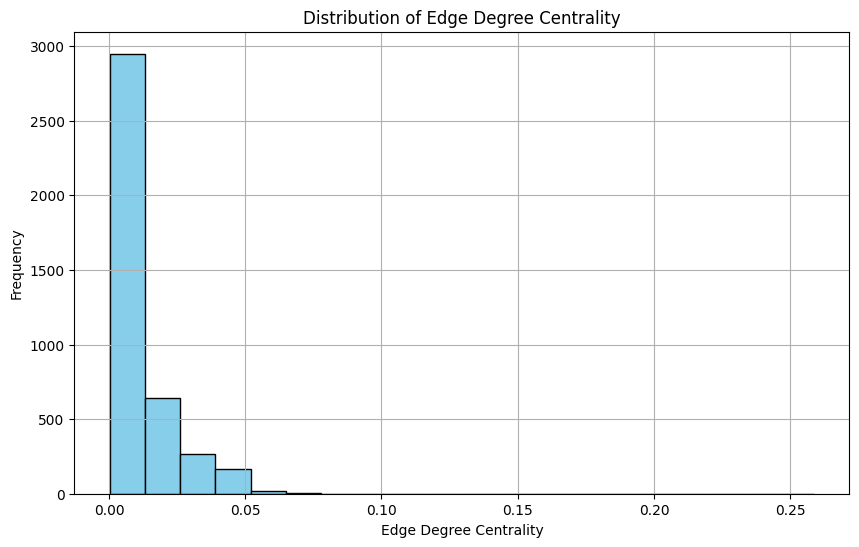

In [264]:
degree_centrality = nx.degree_centrality(G)
highest_degree_nodes = sorted(degree_centrality.items(), key=lambda x:
                              x[1], reverse=True)[:5]
print("Nodes with the highest Degree Centrality:")

for node, centrality in highest_degree_nodes:
    print(f"{node}: {centrality}")



# Plot the distribution of degree centrality values
degree_centrality_values = list(degree_centrality.values())

plt.figure(figsize=(10, 6))
plt.hist(degree_centrality_values, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Edge Degree Centrality')
plt.xlabel('Edge Degree Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#### **Closeness centrality** is calculated and visualized below:


Nodes with the Highest Closeness Centrality:
107: 0.45969945355191255
58: 0.3974018305284913
428: 0.3948371956585509
563: 0.3939127889961955
1684: 0.39360561458231796


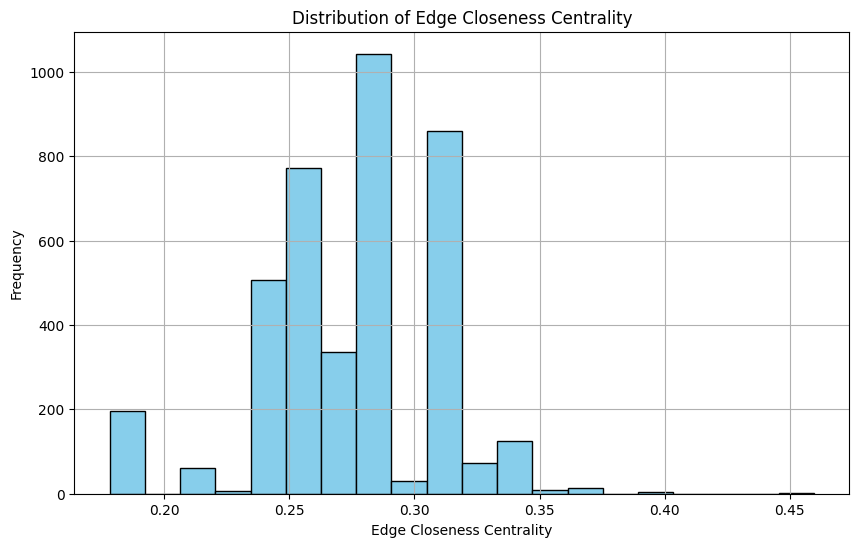

In [265]:
closeness_centrality = nx.closeness_centrality(G)
highest_closeness_nodes = sorted(closeness_centrality.items(),
                                 key=lambda x: x[1], reverse=True)[:5]
print("\nNodes with the Highest Closeness Centrality:")

for node, centrality in highest_closeness_nodes:
    print(f"{node}: {centrality}")


# Plot the distribution of degree centrality values
closeness_centrality_values = list(closeness_centrality.values())

plt.figure(figsize=(10, 6))
plt.hist(closeness_centrality_values, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Edge Closeness Centrality')
plt.xlabel('Edge Closeness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#### **Betweenness centrality** is calculated and visualized below:

To calculate edge centrality, you can use betweenness centrality, which measures how often an edge lies on the shortest paths between other pairs of nodes in the network. 
Here's a breakdown of the concept and how to calculate it:
- Understanding Betweenness Centrality
Concept:
- An edge's betweenness centrality quantifies its importance in facilitating communication or connections between different parts of the network.
- High Betweenness:
An edge with high betweenness centrality is a "bridge" or a critical link, as many shortest paths between nodes pass through it.
- Low Betweenness:
An edge with low betweenness centrality is less important in connecting different parts of the network. 


Nodes with the Highest Betweenness Centrality:
107: 0.4805180785560152
1684: 0.3377974497301992
3437: 0.23611535735892905
1912: 0.2292953395868782
1085: 0.14901509211665306


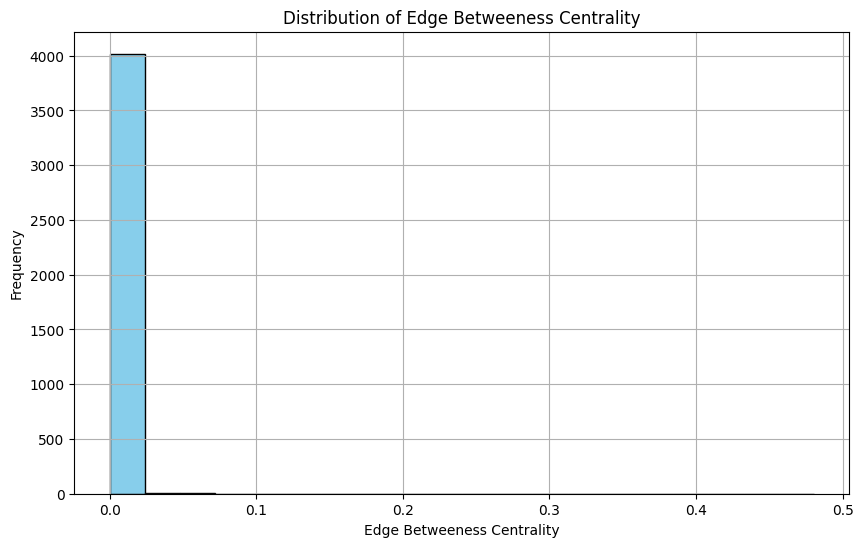

In [266]:
betweenness_centrality = nx.betweenness_centrality(G)
highest_betweenness_nodes = sorted(betweenness_centrality.items(),
                                   key=lambda x: x[1], reverse=True)[:5]
print("\nNodes with the Highest Betweenness Centrality:")

for node, centrality in highest_betweenness_nodes:
    print(f"{node}: {centrality}")


# Plot the distribution of betweeness centrality values
highest_betweenness_val = list(betweenness_centrality.values())

plt.figure(figsize=(10, 6))
plt.hist(highest_betweenness_val, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Edge Betweeness Centrality')
plt.xlabel('Edge Betweeness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#### **Eigenvector centrality** is calculated and visualized below:


Nodes with the Highest Eigenvector Centrality:
1912: 0.09540696149067629
2266: 0.08698327767886552
2206: 0.08605239270584342
2233: 0.08517340912756598
2464: 0.08427877475676092


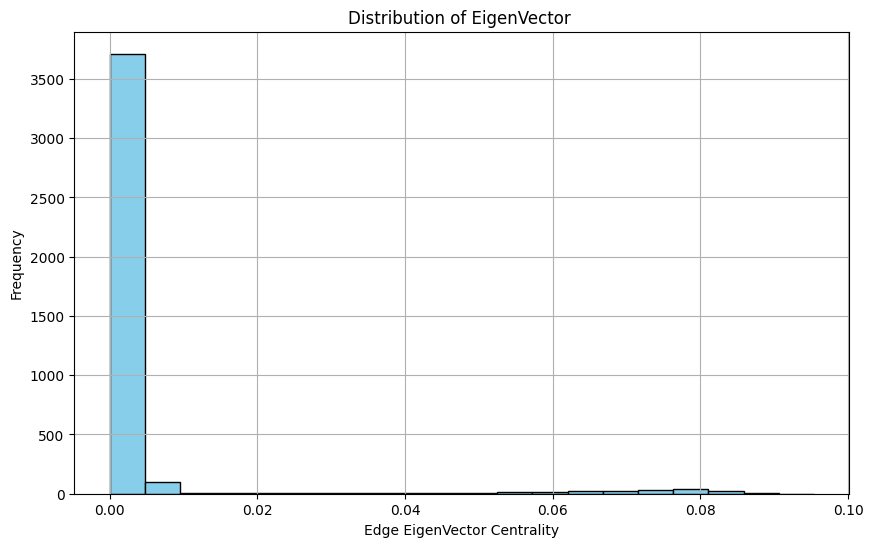

In [267]:
eigenvector_centrality = nx.eigenvector_centrality(G)
highest_eigenvector_nodes = sorted(eigenvector_centrality.items(),
                                   key= lambda x: x[1], reverse=True)[:5]

print("\nNodes with the Highest Eigenvector Centrality:")

for node, centrality in highest_eigenvector_nodes:
    print(f"{node}: {centrality}")

# Plot the distribution of degree centrality values
highest_eigen_val = list(eigenvector_centrality.values())

plt.figure(figsize=(10, 6))
plt.hist(highest_eigen_val, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of EigenVector ')
plt.xlabel('Edge EigenVector Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#### PageRank is calculated and visualized below:


Nodes with the Highest PageRank:
3437: 0.0076145868447496
107: 0.006936420955866117
1684: 0.006367162138306824
0: 0.006289602618466542
1912: 0.003876971600884498


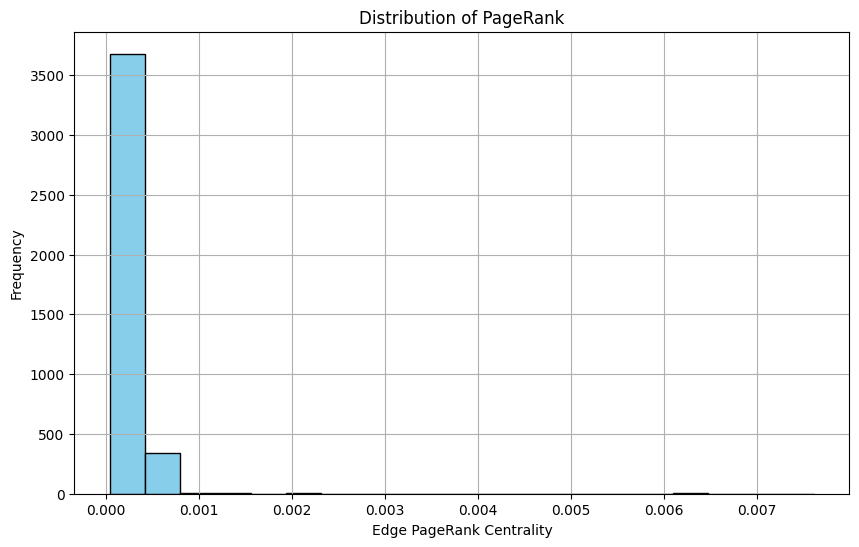

In [268]:
pagerank = nx.pagerank(G)

highest_pagerank_nodes = sorted(pagerank.items(), key=lambda x: x[1],
                                 reverse=True)[:5]
print("\nNodes with the Highest PageRank:")

for node, centrality in highest_pagerank_nodes:
    print(f"{node}: {centrality}")

# Plot the distribution of degree centrality values
highest_pagerank_val = list(pagerank.values())

plt.figure(figsize=(10, 6))
plt.hist(highest_pagerank_val, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of PageRank')
plt.xlabel('Edge PageRank Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Question 10: Use two community detection algorithms to detect the clusters/community within this social network, then compare the difference of results (the number of clusters and numbers of nodes in each cluster).

In [269]:
!pip install community

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [270]:
# import communities
import community as community_louvain
from networkx.algorithms.community import girvan_newman


## Chosen community detection algorithms
- Louvian Modularity
- Label Propagation

In [271]:
# community algortihms
algorithms = ["Louvian Modularity", "Label Propagation"]

# Dictionary to store communities detected by each algorithm
detected_communities = {}

# Apply each community detection algorithm and store the detected communities
for algorithm in algorithms:
    if algorithm == "Louvian Modularity":
        communities = nx.algorithms.community.greedy_modularity_communities(G)
    elif algorithm == "Label Propagation":
        communities = nx.algorithms.community.label_propagation_communities(G)
    detected_communities[algorithm] = communities

# Print the detected communities
print(detected_communities)
print('Community detection done')


{'Louvian Modularity': [frozenset({1061, 1239, 1271, 3313, 1285, 1290, 3326, 1301, 3337, 3340, 3347, 3355, 1323, 3360, 1329, 3365, 1330, 3368, 3370, 2661, 2662, 2665, 2667, 2668, 2671, 2672, 2674, 2675, 2677, 2678, 1346, 2682, 2684, 2685, 2686, 2687, 2688, 2690, 2691, 2692, 2693, 2696, 2697, 2700, 2701, 2702, 3386, 2707, 2708, 2709, 2711, 2712, 2713, 2714, 2715, 2716, 2718, 2719, 2720, 2721, 2722, 2723, 2724, 2725, 2727, 2728, 2730, 2732, 2733, 2734, 2735, 2736, 2737, 2739, 2742, 2744, 2747, 2748, 2751, 2752, 2753, 2758, 2759, 2760, 2762, 2764, 2765, 2768, 2770, 2771, 2772, 2775, 2776, 2778, 2779, 2780, 2781, 3402, 2783, 2784, 2785, 3403, 2787, 2788, 2790, 2791, 2792, 2793, 2795, 2796, 2797, 3405, 2799, 2801, 2802, 2803, 2804, 2805, 2808, 2811, 2812, 2813, 2816, 2818, 2819, 2820, 2822, 2823, 2824, 2825, 2826, 2828, 2829, 2830, 2831, 2832, 2833, 2836, 2840, 2841, 2842, 2843, 2844, 2845, 2846, 2847, 2848, 2849, 2853, 2855, 2856, 2857, 2858, 2859, 2860, 2861, 2863, 2865, 2868, 2869, 2870,

In [272]:
# Evaluate and compare the results
for algorithm, communities in detected_communities.items():
    modularity = nx.algorithms.community.modularity(G, communities)
    num_communities = len(communities) 
    average_community_size = sum(len(community) for community in communities) / num_communities
    
    print(f"{algorithm}:")
    print(f"Modularity: {modularity}")
    print(f"Number of Communities: {num_communities}")
    print(f"Average Community Size: {average_community_size}")
    
    # Print number of nodes in each cluster
    for i, community in enumerate(communities):
        print(f"Cluster {i + 1}: {len(community)} nodes")
    
    print("\n")


Louvian Modularity:
Modularity: 0.7773775199040279
Number of Communities: 13
Average Community Size: 310.6923076923077
Cluster 1: 983 nodes
Cluster 2: 815 nodes
Cluster 3: 548 nodes
Cluster 4: 543 nodes
Cluster 5: 372 nodes
Cluster 6: 219 nodes
Cluster 7: 208 nodes
Cluster 8: 206 nodes
Cluster 9: 59 nodes
Cluster 10: 37 nodes
Cluster 11: 25 nodes
Cluster 12: 18 nodes
Cluster 13: 6 nodes


Label Propagation:
Modularity: 0.7368407345348215
Number of Communities: 44
Average Community Size: 91.79545454545455
Cluster 1: 198 nodes
Cluster 2: 36 nodes
Cluster 3: 10 nodes
Cluster 4: 8 nodes
Cluster 5: 8 nodes
Cluster 6: 34 nodes
Cluster 7: 2 nodes
Cluster 8: 215 nodes
Cluster 9: 16 nodes
Cluster 10: 3 nodes
Cluster 11: 3 nodes
Cluster 12: 1030 nodes
Cluster 13: 6 nodes
Cluster 14: 7 nodes
Cluster 15: 3 nodes
Cluster 16: 3 nodes
Cluster 17: 753 nodes
Cluster 18: 10 nodes
Cluster 19: 2 nodes
Cluster 20: 2 nodes
Cluster 21: 469 nodes
Cluster 22: 13 nodes
Cluster 23: 9 nodes
Cluster 24: 3 nodes
Cl

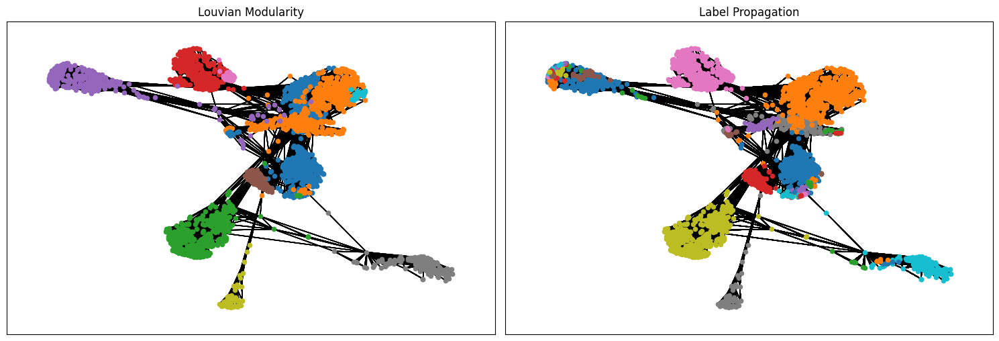

In [273]:
## Visualize the community structures 

# Visualize community structures
plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G)

for i, (algorithm, communities) in enumerate(detected_communities.items()):
    plt.subplot(2, 2, i + 1)
    colors = [f'C{i}' for i in range(len(communities))]
    
    for j, community in enumerate(communities):
        nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=colors[j], node_size=20)
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        
        plt.title(algorithm)
        plt.tight_layout()
# show the visualization
plt.show()